In [1]:
%load_ext jupyter_black

import warnings

warnings.filterwarnings("ignore")

from IPython.display import display, HTML

In [2]:
import funciones_graficos as fg

In [3]:
import numpy as np
import pandas as pd
import geopandas as gpd
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go

layout = go.Layout

In [4]:
# data = pd.read_pickle("vdbg_final.pkl")

data = pd.read_csv("raw/datos_2024.csv", index_col=0)

In [5]:
parentesco_lista = [
    s for s in list(data.columns) if "parentesco_" in s or "identificacion_" in s
]

In [6]:
data.loc[:, parentesco_lista] = data[parentesco_lista].astype("category")

In [7]:
data.edad = data.edad.astype("category").cat.set_categories(
    ["14-17", "18-25", "26-40", "41-60", "Más de 60"], ordered=True
)

In [8]:
data.horas_internet = data.horas_internet.astype("category").cat.set_categories(
    [
        "No lo utilizo diariamente",
        "Menos de 2 horas",
        "2-4 horas",
        "5-7 horas",
        "Más de 7 horas",
    ],
    ordered=True,
)

In [9]:
# data.info()

# Reporte de resultados

{{< pagebreak >}}

Los resultados corresponden a 386 respuestas obtenidas. A continuación se muestra la cantidad de respuestas por sexo y género.

In [10]:
tbl_sexo = data.sexo.value_counts()

In [11]:
fig = go.Figure(
    data=[go.Pie(labels=tbl_sexo.index, values=tbl_sexo)],
)
fig.update_layout(
    title_text="Respuestas por sexo",
    legend_title="Sexo",
    font=dict(family="Arial", size=18, color="black"),
    width=1500,
    height=900,
    legend=dict(font=dict(size=18)),
)
fig.update_traces(
    marker=dict(
        colors=["rgb(149, 27, 129)", "rgb(57, 105, 172)", "rgb(7, 171, 157)"],
        line=dict(color="white", width=1),
    )
)
fig.show()
fig.write_image("img/1.png");

In [12]:
df_sexo_genero = data.pivot_table(
    columns="sexo", index="genero", aggfunc={"sexo": "count"}
).fillna(0)
df_sexo_genero.index.name = "Género"
df_sexo_genero.columns.names = [None, "Sexo"]
df_sexo_genero.columns = df_sexo_genero.columns.droplevel(0)
df_sexo_genero.astype("int")

Sexo,Hombre,Mujer,Prefiero no responder
Género,,,
Femenino,0,221,1
Masculino,11,1,0
Prefiero no decir,0,1,1
Trans masculino,1,0,0


In [13]:
df_sg = df_sexo_genero.stack(level=0)
pd.DataFrame(round(df_sg / df_sg.sum() * 100, 2)).rename(columns={0: "%"})

%
Género            Sexo                        
Femenino          Hombre                  0.00
                  Mujer                  93.25
                  Prefiero no responder   0.42
Masculino         Hombre                  4.64
                  Mujer                   0.42
                  Prefiero no responder   0.00
Prefiero no decir Hombre                  0.00
                  Mujer                   0.42
                  Prefiero no responder   0.42
Trans masculino   Hombre                  0.42
                  Mujer                   0.00
                  Prefiero no responder   0.00

In [14]:
datos = data.query("sexo == 'Mujer'")

{{< pagebreak >}}

## Resultados para las mujeres

{{< pagebreak >}}

Los siguientes resultados corresponden a las **mujeres** que respondieron la encuesta.

### Respuestas por rangos de edad

In [15]:
tbl_edad = pd.DataFrame(datos.edad.value_counts()).sort_index()

In [16]:
tbl_edad_porcentaje = (
    round(tbl_edad / tbl_edad.sum() * 100, 2)["count"].astype(str) + " %"
)

In [17]:
fig = px.bar(tbl_edad, text=tbl_edad_porcentaje)
fig.update_layout(
    title="Rangos de edades",
    xaxis_title="Edades",
    yaxis_title="% de mujeres",
    font=dict(
        family="Arial",
        size=18,
        color="black",
    ),
    width=1500,
    height=800,
)
fig.update_traces(
    textfont_size=18,
    textangle=0,
    textposition="outside",
    cliponaxis=False,
    showlegend=False,
    marker_color="rgb(7, 171, 157)",
    marker_line_color="white",
)
fig.show()
fig.write_image("img/edades.png")

### Respuestas por estados

In [18]:
serie_estados = datos.estado.value_counts()

In [19]:
fp = "./Estados_Venezuela/Estados_Venezuela.shp"
df_mapa = gpd.read_file(fp)

In [20]:
ls = []
for i in df_mapa.ESTADO:
    if i in serie_estados.index:
        ls.append(serie_estados.loc[i])
    else:
        ls.append(0)
df_mapa["Mujeres"] = ls

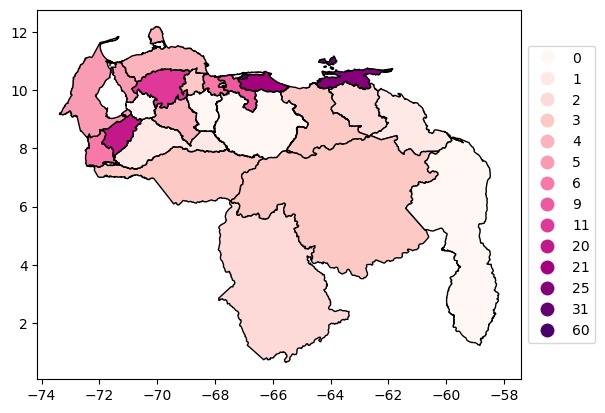

In [21]:
df_mapa.plot(
    "Mujeres",
    cmap="RdPu",
    edgecolor="black",
    categorical=True,
    legend=True,
    legend_kwds={"loc": "center left", "bbox_to_anchor": (1, 0.5), "fmt": "{:.0f}"},
);

In [22]:
informacion_estados = pd.DataFrame(serie_estados.sort_index())
informacion_estados["%"] = round(
    informacion_estados / informacion_estados.sum() * 100, 2
)
informacion_estados.rename_axis(index={"estado": "Estado"}, inplace=True)
informacion_estados.rename(columns={"count": "Nº de mujeres"})

,Nº de mujeres,%
Estado,,
Amazonas,2,0.90
Anzoátegui,3,1.35
Apure,3,1.35
Aragua,9,4.04
Barinas,1,0.45
Bolívar,3,1.35
Carabobo,6,2.69
Delta Amacuro,1,0.45
Distrito Capital,60,26.91


### Ocupaciones de las mujeres

In [23]:
for i in [
    "Defensora de DDHH de las mujeres",
    "Trabajo social ",
    "Trabajador social ",
    "Trabajadora Social",
    "Trabajadora Social ",
    "Trabajadora social. Actriz militante afrofemisnita",
    "Trabajadora humanitaria",
    "Promotora Social ",
    "Trabajadora Humanitaria",
    "Trabajadora de organización internacional ",
    "Gestora de casos en VBG Y TDP ",
    "El feminismo ",
    "Defensora de Mujeres ",
    "Atención a víctimas de VBG" "Defensora de DDHH de las mujeres",
    "Atención a víctimas de VBG",
    "El feminismo ",
    "Trabajando social ) Ayuda humanista",
]:
    datos.loc[datos["ocupacionO"] == i, "ocupacion"] = "Trabajo social"

In [24]:
for i in [
    "Del hogar ",
    "Crianza y cuidado del hogar ",
    "Ama de casa",
    "Trabajo on line. Trabajadora del hogar",
]:
    datos.loc[datos["ocupacionO"] == i, "ocupacion"] = "Ama de casa"

In [25]:
datos.loc[datos["ocupacionO"] == "Abogado", "ocupacion"] = "Abogado(a)"

In [26]:
datos.loc[datos["ocupacionO"] == "Psicologa ", "ocupacion"] = "Psicólogo(a)"

### Ocupaciones más comunes

In [27]:
df_ocupaciones = (
    pd.DataFrame(datos.ocupacion.value_counts())
    .rename_axis(index={"ocupacion": "Ocupación"})
    .rename(columns={"count": "Nº de mujeres"})
)
df_ocupaciones["%"] = round(df_ocupaciones / len(datos) * 100, 2)
df_ocupaciones.drop("Otra")[:10]

,Nº de mujeres,%
Ocupación,,
Docente,44,19.73
Estudiante,29,13.00
Empleado(a) Público(a),16,7.17
Abogado(a),13,5.83
Ingeniero(a),13,5.83
Asistente Administrativo,13,5.83
Periodista,7,3.14
Psicólogo(a),6,2.69
Administrador(a),6,2.69


En el caso de "otra" hay 34 respuestas, que se dividen de la siguiente manera:

In [28]:
pd.DataFrame(datos.query('ocupacion == "Otra"').ocupacionO.value_counts()).rename_axis(
    index={"ocupacionO": "Ocupación"}
).rename(columns={"count": "Nº de mujeres"})

,Nº de mujeres
Ocupación,
Trabajadora social,3
Trabajadora social,3
Activista,1
Antropologa,1
Productora de eventos,1
Defensora derechos de las mujeres,1
trabajo social,1
Ana de casa y madre,1
En el hogar,1


### Horas de uso de internet

In [29]:
tbl_uso_internet = pd.DataFrame(datos.horas_internet.value_counts().sort_index())

In [30]:
tbl_uso_porcentaje = (
    round(tbl_uso_internet / tbl_uso_internet.sum() * 100, 2)["count"].astype(str)
    + " %"
)

In [31]:
fig = px.bar(tbl_uso_internet, text=tbl_uso_porcentaje)
fig.update_layout(
    title="Uso de internet por rangos de tiempo",
    xaxis_title="Tiempo",
    yaxis_title="% de mujeres",
    font=dict(
        family="Arial",
        size=18,
        color="black",
    ),
    width=1500,
    height=800,
)
fig.update_traces(
    textfont_size=18,
    textangle=0,
    textposition="outside",
    cliponaxis=False,
    showlegend=False,
    marker_color="rgb(149, 27, 129)",
    marker_line_color="white",
)
fig.show()
fig.write_image("img/uso_internet.png")

### Principales usos de internet

In [32]:
tbl_usos = pd.DataFrame(
    datos[
        [
            "uso_familia",
            "uso_trabajo",
            "uso_venta",
            "uso_distraer",
            "uso_estudiar",
            "uso_banco",
            "uso_otra",
            "uso_peli",
            "uso_noticias",
        ]
    ].sum()
)

In [33]:
tbl_usos.index = [
    "Comunicarme con familiares y amigos/as",
    "Trabajar",
    "Vender productos",
    "Distraerme",
    "Estudiar o investigar",
    "Realizar operaciones bancarias",
    "Otras actividades",
    "Ver películas y/o series",
    "Ver noticias",
]

In [34]:
tbl_usos_porcentaje = pd.DataFrame(
    round(tbl_usos / tbl_usos.sum() * 100, 2)[0].astype(str) + " %"
)

In [35]:
tbl_usos_concat = pd.concat(
    [tbl_usos, tbl_usos_porcentaje.rename(columns={0: "p"})], axis=1
).sort_values(0)

In [36]:
fig = px.bar(tbl_usos_concat[0], text=tbl_usos_concat.p)
fig.update_layout(
    title="Usos de internet",
    xaxis_title="Actividades",
    yaxis_title="% de mujeres",
    font=dict(
        family="Arial",
        size=18,
        color="black",
    ),
    width=1500,
    height=800,
)
fig.update_traces(
    textfont_size=18,
    textangle=0,
    textposition="outside",
    cliponaxis=False,
    showlegend=False,
    marker_color="rgb(149, 27, 129)",
    marker_line_color="white",
)
fig.show()
fig.write_image("img/usos_internet.png")

En el caso de la respuesta "Otras actividades", se desglosa de la siguiente manera:

In [37]:
pd.DataFrame(datos.uso_otraR.value_counts()).rename_axis(
    index={"uso_otraR": "Otros usos de internet"}
).rename(columns={"count": "Nº de mujeres"})

,Nº de mujeres
Otros usos de internet,
Promover políticas para la defensa de la mujer,1
Teletrabajo,1
Quiero vender libros,1
Buscar y escuchar música,1
Ver tutoriales creativos,1
Redes sociales,1


### Aumento de uso de internet por Covid19

In [38]:
tbl_covid_aumento = datos.covid_aumento.value_counts()

In [39]:
fig = go.Figure(data=[go.Pie(labels=tbl_covid_aumento.index, values=tbl_covid_aumento)])
fig.update_layout(
    title_text="Aumento del uso de internet",
    legend_title="¿Has aumentado tu tiempo de <br> conexión a internet?",
    font=dict(family="Arial", size=18, color="black"),
    width=1500,
    height=1000,
    legend=dict(font=dict(size=18)),
)
fig.update_traces(
    marker=dict(
        colors=["rgb(149, 27, 129)", "rgb(57, 105, 172)", "rgb(7, 171, 157)"],
        line=dict(color="white", width=1),
    )
)
fig.show()
fig.write_image("img/covid.png")

### Uso de redes sociales/aplicaciones

In [40]:
datos.loc[:, "telegram"] = datos.telegram.apply(str.strip)

In [41]:
redes = [
    "facebook",
    "twitter",
    "instagram",
    "tiktok",
    "discord",
    "slack",
    "citas",
    "videojuegos",
    "whatsapp",
    "telegram",
    "reddit",
    "estudio",
    "linkedin",
    "twich",
    "youtube",
    "pinterest",
    "flickr",
]

dicts = {}
for i in redes:
    dicts[i.capitalize()] = (
        datos[[i]].value_counts().reset_index().set_index(i)["count"]
    )

In [42]:
tbl_aplicaciones = round(
    (
        pd.DataFrame.from_dict(dicts, orient="index").fillna(0)[
            [
                "Menos de 2 horas",
                "2-4 horas",
                "5-7 horas",
                "Más de 7 horas",
                "No la utilizo",
            ]
        ]
        / len(datos)
    )
    * 100,
    2,
)

In [43]:
fig = px.bar(
    tbl_aplicaciones.sort_values("No la utilizo"),
    orientation="h",
    color_discrete_sequence=px.colors.qualitative.Bold[:4]
    + [px.colors.qualitative.Prism_r[0]],
    width=1500,
    height=800,
)
fig.update_layout(
    title="Uso de aplicaciones/redes sociales",
    xaxis_title="% de mujeres",
    yaxis_title="Aplicación/red social",
    legend_title="Horas de uso diario",
    font=dict(
        family="Arial",
        size=18,
        color="black",
    ),
)

fig.show()
fig.write_image("img/uso_apps.png")

### Incidencia de violencias

In [44]:
violencias_nombres = {
    "identidad": "Duplicación de identidad",
    "ciberacoso": "Ciberacoso",
    "doxxing": "Doxxing",
    "mobbing": "Mobbing",
    "ciberdifamacion": "Ciberdifamación",
    "stalking": "Cibervigilancia (stalking)",
    "ciberextorsion": "Ciberextorsión",
    "grooming": "Grooming",
    "phishing_vs": "Phishing/Vishing/Smishing",
    "trata": "Trata de personas en línea",
    "explotacion": "Captación con fines de explotación sexual",
    "exclusion": "Exclusión digital",
    "cyberflashing": "Cyberflashing",
    "deepfake": "Deepfake",
    "clonacion": "Clonación de aplicaciones",
}

In [45]:
violencias = list(violencias_nombres.keys())

In [46]:
dic = {}
for i in violencias:
    datos.loc[:, i] = datos[i].apply(str.strip).apply(str.capitalize)
    dic[violencias_nombres[i]] = datos[[i]].value_counts().sort_index()

In [47]:
tbl_sufrio = pd.DataFrame.from_dict(dic, orient="index").fillna(0)

In [48]:
tbl_sufrio

,No,Sí
Duplicación de identidad,197,26
Ciberacoso,144,79
Doxxing,197,26
Mobbing,185,38
Ciberdifamación,190,33
Cibervigilancia (stalking),128,95
Ciberextorsión,205,18
Grooming,187,36
Phishing/Vishing/Smishing,197,26
Trata de personas en línea,208,15


In [49]:
tbl_sufrio = tbl_sufrio.set_axis(["No", "Sí"], axis=1)

In [50]:
sufrio_porcentaje = round(tbl_sufrio / len(datos) * 100, 2)

In [51]:
fig = px.bar(
    sufrio_porcentaje[["Sí", "No"]].sort_values("Sí"),
    orientation="h",
    text_auto=True,
    color_discrete_map={"Sí": "rgb(149, 27, 129)", "No": "rgb(57, 105, 172)"},
    width=1500,
    height=800,
)
fig.update_layout(
    title="Incidencia de violencias",
    yaxis_title="Violencia",
    xaxis_title="% de mujeres",
    legend_title="¿Sufrió la violencia?",
    font=dict(
        family="Arial",
        size=18,
        color="black",
    ),
)
fig.update_traces(
    textfont_size=18,
    textangle=0,
    cliponaxis=False,
    marker_line_color="white",
    texttemplate="%{value: 4} %",
)
fig.show()
fig.write_image("img/incidencia.png")

In [52]:
for i in violencias:
    datos.loc[:, i].replace(
        [
            "No",
            "Sí",
        ],
        [0, 1],
        inplace=True,
    )

In [53]:
tbl_numero_violencia = pd.DataFrame(
    datos[violencias].T.sum().value_counts()
).sort_index()
tbl_violencia_porcentaje = round(tbl_numero_violencia / len(datos) * 100, 2)

In [54]:
tbl_violencia_porcentaje.index = tbl_violencia_porcentaje.index.astype("string")

In [55]:
fig = px.bar(
    tbl_violencia_porcentaje,
    text_auto=True,
)
fig.update_layout(
    title="Cantidad de violencias sufridas",
    xaxis_title="Nº de violencias sufridas",
    yaxis_title="% de mujeres",
    font=dict(
        family="Arial",
        size=18,
        color="black",
    ),
    width=1500,
    height=800,
)
fig.update_traces(
    textfont_size=18,
    textangle=0,
    textposition="outside",
    cliponaxis=False,
    showlegend=False,
    marker_line_color="white",
    marker_color="rgb(149, 27, 129)",
    texttemplate="%{value}%",
)
fig.show()
fig.write_image("img/numero_violencia.png")

In [56]:
dic_violencias = {}
for i in violencias:
    dic_violencias[i] = [s for s in list(datos.columns)[:-32] if i in s]

#### Resultados para los casos de duplicación de identidad

In [57]:
tbl_identidad = datos.query("identidad == 1")[dic_violencias["identidad"]]

Se han reportado 43 casos de duplicación de identidad.

In [58]:
frecuencia_identidad = fg.grafico_frecuencia(tbl_identidad)

In [59]:
temporalidad_identidad = fg.grafico_temporalidad(tbl_identidad)

In [60]:
tbl_identidad.columns

Index(['identidad', 'veces_identidad', '6_identidad', 'edad_identidad',
       'parentesco_identidad', 'sexo_identidad', 'medio_identidad',
       'twitter_identidad', 'facebook_identidad', 'whatsapp_identidad',
       'telegram_identidad', 'instagram_identidad', 'correo_identidad',
       'tiktok_identidad', 'citas_identidad', 'videojuegos_identidad',
       'estudio_identidad', 'trabajo_identidad', 'otra_identidad',
       'otraR_identidad'],
      dtype='object')

In [61]:
edad_identidad = fg.grafico_edad(tbl_identidad)

In [62]:
parentesco_identidad = fg.grafico_parentesco(tbl_identidad)

In [63]:
sexo_identidad = fg.grafico_sexo_parentesco(tbl_identidad)

In [64]:
medios_identidad = fg.grafico_medios(tbl_identidad)[2]

In [65]:
pd.DataFrame(tbl_identidad.otraR_identidad.value_counts()).rename_axis(
    index={"otraR_identidad": "Otras aplicaciones o redes sociales"}
).rename(columns={"count": "N° de Mujeres"})

,N° de Mujeres
Otras aplicaciones o redes sociales,
Páginas pornográficas,1


#### Resultados para los casos de ciberacoso

In [66]:
tbl_ciberacoso = datos.query("ciberacoso == 1")[dic_violencias["ciberacoso"]]

Se han reportado 135 casos de ciberacoso.

In [67]:
frecuencia_ciberacoso = fg.grafico_frecuencia(tbl_ciberacoso)

In [68]:
temporalidad_ciberacoso = fg.grafico_temporalidad(tbl_ciberacoso)

In [69]:
edad_ciberacoso = fg.grafico_edad(tbl_ciberacoso)

In [70]:
parentesco_ciberacoso = fg.grafico_parentesco(tbl_ciberacoso)

In [71]:
sexo_ciberacoso = fg.grafico_sexo_parentesco(tbl_ciberacoso)

In [72]:
medios_ciberacoso = fg.grafico_medios(tbl_ciberacoso)[2]

In [73]:
pd.DataFrame(tbl_ciberacoso.otraR_ciberacoso.value_counts()).rename_axis(
    index={"otraR_ciberacoso": "Otras aplicaciones o redes sociales"}
).rename(columns={"count": "N° de mujeres"})

,N° de mujeres
Otras aplicaciones o redes sociales,


#### Resultados para los casos doxxing

In [74]:
tbl_doxxing = datos.query("doxxing == 1")[dic_violencias["doxxing"]]

Se han reportado 45 casos de doxxing.

In [75]:
frecuencia_doxxing = fg.grafico_frecuencia(tbl_doxxing)

In [76]:
temporalidad_doxxing = fg.grafico_temporalidad(tbl_doxxing)

In [77]:
edad_doxxing = fg.grafico_edad(tbl_doxxing)

In [78]:
parentesco_doxxing = fg.grafico_parentesco(tbl_doxxing)

In [79]:
sexo_doxxing = fg.grafico_sexo_parentesco(tbl_doxxing)

In [80]:
medios_doxxing = fg.grafico_medios(tbl_doxxing)[2]

In [81]:
pd.DataFrame(tbl_doxxing.otraR_doxxing.value_counts()).rename_axis(
    index={"otraR_doxxing": "Otras aplicaciones o redes sociales"}
).rename(columns={"count": "N° de mujeres"})

,N° de mujeres
Otras aplicaciones o redes sociales,
Medios de comunicación,1
Medios digitales artículo de opinión,1
Una plataforma que replicaba mi Instagram. Pero no era IG,1
Persona a persona,1
Google,1
Sitio web,1


#### Resultados para los casos de mobbing

In [82]:
tbl_mobbing = datos.query("mobbing == 1")[dic_violencias["mobbing"]]

Se han reportado 58 casos de mobbing.

In [83]:
frecuencia_mobbing = fg.grafico_frecuencia(tbl_mobbing)

In [84]:
temporalidad_mobbing = fg.grafico_temporalidad(tbl_mobbing)

In [85]:
tbl_mobbing.columns

Index(['mobbing', 'veces_mobbing', '6_mobbing', 'edad_mobbing',
       'parentesco_mobbing', 'sexo_mobbing', 'medio_mobbing',
       'twitter_mobbing', 'facebook_mobbing', 'whatsapp_mobbing',
       'telegram_mobbing', 'instagram_mobbing', 'correo_mobbing',
       'tiktok_mobbing', 'sms_mobbing', 'citas_mobbing', 'videojuegos_mobbing',
       'estudio_mobbing', 'trabajo_mobbing', 'red_mobbing', 'otra_mobbing',
       'otraR_mobbing'],
      dtype='object')

In [86]:
edad_mobbing = fg.grafico_edad(tbl_mobbing)

In [87]:
parentesco_mobbing = fg.grafico_parentesco(tbl_mobbing)

In [88]:
sexo_mobbing = fg.grafico_sexo_parentesco(tbl_mobbing)

In [89]:
medios_mobbing = fg.grafico_medios(tbl_mobbing)[2]

In [90]:
pd.DataFrame(tbl_mobbing.otraR_mobbing.value_counts()).rename_axis(
    index={"otraR_mobbing": "Otras aplicaciones o redes sociales"}
).rename(columns={"count": "N° de mujeres"})

,N° de mujeres
Otras aplicaciones o redes sociales,
YouTube,1


#### Resultados para los casos de ciberdifamación

In [91]:
tbl_ciberdifamacion = datos.query("ciberdifamacion == 1")[
    dic_violencias["ciberdifamacion"]
]

Se han reportado 60 casos de ciberdifamación.

In [92]:
frecuencia_ciberdifamacion = fg.grafico_frecuencia(tbl_ciberdifamacion)

In [93]:
temporalidad_ciberdifamacion = fg.grafico_temporalidad(tbl_ciberdifamacion)

In [94]:
edad_ciberdifamacion = fg.grafico_edad(tbl_ciberdifamacion)

In [95]:
parentesco_ciberdifamacion = fg.grafico_parentesco(tbl_ciberdifamacion)

In [96]:
sexo_ciberdifamacion = fg.grafico_sexo_parentesco(tbl_ciberdifamacion)

In [97]:
medios_ciberdifamacion = fg.grafico_medios(tbl_ciberdifamacion)[2]

In [98]:
pd.DataFrame(tbl_ciberdifamacion.otraR_ciberdifamacion.value_counts()).rename_axis(
    index={"otraR_ciberdifamacion": "Otras aplicaciones o redes sociales"}
).rename(columns={"count": "N° de mujeres"})

,N° de mujeres
Otras aplicaciones o redes sociales,
Ask,1
Medios digitales artículo de opinión,1
Páginas pornográficas,1
persona a persona,1
Televisión,1


#### Resultados para los casos de cibervigilancia (stalking)

In [99]:
tbl_stalking = datos.query("stalking == 1")[dic_violencias["stalking"]]

Se han reportado 166 casos de stalking.

In [100]:
frecuencia_stalking = fg.grafico_frecuencia(tbl_stalking)

In [101]:
temporalidad_stalking = fg.grafico_temporalidad(tbl_stalking)

In [102]:
edad_stalking = fg.grafico_edad(tbl_stalking)

In [103]:
parentesco_stalking = fg.grafico_parentesco(tbl_stalking)

In [104]:
sexo_stalking = fg.grafico_sexo_parentesco(tbl_stalking)

In [105]:
medios_stalking = fg.grafico_medios(tbl_stalking)[2]

In [106]:
pd.DataFrame(tbl_stalking.otraR_stalking.value_counts()).rename_axis(
    index={"otraR_stalking": "Otras aplicaciones o redes sociales"}
).rename(columns={"count": "N° de mujeres"})

,N° de mujeres
Otras aplicaciones o redes sociales,
linkedin,1
Messenger,1


#### Resultados para los casos de ciberextorsión

In [107]:
tbl_ciberextorsion = datos.query("ciberextorsion == 1")[
    dic_violencias["ciberextorsion"]
]

Se han reportado 21 casos de ciberextorsión.

In [108]:
frecuencia_ciberextorsion = fg.grafico_frecuencia(tbl_ciberextorsion)

In [109]:
temporalidad_ciberextorsion = fg.grafico_temporalidad(tbl_ciberextorsion)

In [110]:
edad_ciberextorsion = fg.grafico_edad(tbl_ciberextorsion)

In [111]:
parentesco_ciberextorsion = fg.grafico_parentesco(tbl_ciberextorsion)

In [112]:
sexo_ciberextorsion = fg.grafico_sexo_parentesco(tbl_ciberextorsion)

Para ciberextorsión todas las personas agresoras son de sexo Hombre


In [113]:
medios_ciberextorsion = fg.grafico_medios(tbl_ciberextorsion)[2]

In [114]:
pd.DataFrame(tbl_ciberextorsion.otraR_ciberextorsion.value_counts()).rename_axis(
    index={"otraR_ciberextorsion": "Otras aplicaciones o redes sociales"}
).rename(columns={"count": "N° de mujeres"})

,N° de mujeres
Otras aplicaciones o redes sociales,
Telegram,1
Personal,1


#### Resultados para los casos de grooming

In [115]:
tbl_grooming = datos.query("grooming == 1")[dic_violencias["grooming"]]

Se han reportado 40 casos de grooming.

In [116]:
frecuencia_grooming = fg.grafico_frecuencia(tbl_grooming)

In [117]:
temporalidad_grooming = fg.grafico_temporalidad(tbl_grooming)

In [118]:
edad_grooming = fg.grafico_edad(tbl_grooming)

In [119]:
parentesco_grooming = fg.grafico_parentesco(tbl_grooming)

In [120]:
sexo_grooming = fg.grafico_sexo_parentesco(tbl_grooming)

In [121]:
medios_grooming = fg.grafico_medios(tbl_grooming)[2]

In [122]:
pd.DataFrame(tbl_grooming.otraR_grooming.value_counts()).rename_axis(
    index={"otraR_grooming": "Otras aplicaciones o redes sociales"}
).rename(columns={"count": "N° de mujeres"})

,N° de mujeres
Otras aplicaciones o redes sociales,
Pin,1
Skype,1
Messenger,1
Oasis active,1


#### Resultados para los casos de phishing-vishing-smishing

In [123]:
tbl_phishing_vs = datos.query("phishing_vs == 1")[dic_violencias["phishing_vs"]]

Se han reportado 78 casos de phishing-vishing-smishing.

In [124]:
frecuencia_phishing_vs = fg.grafico_frecuencia(tbl_phishing_vs)

In [125]:
temporalidad_phishing_vs = fg.grafico_temporalidad(tbl_phishing_vs)

In [126]:
edad_phishing_vs = fg.grafico_edad(tbl_phishing_vs)

In [127]:
parentesco_phishing_vs = fg.grafico_parentesco(tbl_phishing_vs)

In [128]:
sexo_phishing_vs = fg.grafico_sexo_parentesco(tbl_phishing_vs)

In [129]:
pd.DataFrame(tbl_phishing_vs.otraR_phishing_vs.value_counts()).rename_axis(
    index={"otraR_phishing_vs": "Otras aplicaciones o redes sociales"}
).rename(columns={"count": "N° de mujeres"})

,N° de mujeres
Otras aplicaciones o redes sociales,
Medios de comunicación,1


In [130]:
medios_phishing_vs = fg.grafico_medios(tbl_phishing_vs)[2]

#### Resultados para los casos de trata de personas en línea

In [131]:
for i in datos.query("otraR_trata == 'Instagram '").index:
    datos.loc[i, "instagram_trata"] = True

In [132]:
tbl_trata = datos.query("trata == 1")[dic_violencias["trata"]]

Se han reportado 39 casos de trata de personas en línea.

In [133]:
frecuencia_trata = fg.grafico_frecuencia(tbl_trata)

In [134]:
temporalidad_trata = fg.grafico_temporalidad(tbl_trata)

In [135]:
edad_trata = fg.grafico_edad(tbl_trata)

In [136]:
parentesco_trata = fg.grafico_parentesco(tbl_trata)

In [137]:
sexo_trata = fg.grafico_sexo_parentesco(tbl_trata)

Para trata de personas en línea todas las personas agresoras son de sexo Mujer


In [138]:
medios_trata = fg.grafico_medios(tbl_trata)[2]

In [139]:
pd.DataFrame(tbl_trata.otraR_trata.value_counts()).rename_axis(
    index={"otraR_trata": "Otras aplicaciones o redes sociales"}
).rename(columns={"count": "N° de mujeres"}).iloc[1:]

,N° de mujeres
Otras aplicaciones o redes sociales,


#### Resultados para los casos de captación con fines de explotación sexual

In [140]:
tbl_explotacion = datos.query("explotacion == 1")[dic_violencias["explotacion"]]

Se han reportado 7 casos de captación con fines de explotación sexual.

In [141]:
frecuencia_explotacion = fg.grafico_frecuencia(tbl_explotacion)

In [142]:
temporalidad_explotacion = fg.grafico_temporalidad(tbl_explotacion)

In [143]:
edad_explotacion = fg.grafico_edad(tbl_explotacion)

In [144]:
parentesco_explotacion = fg.grafico_parentesco(tbl_explotacion)

In [145]:
sexo_explotacion = fg.grafico_sexo_parentesco(tbl_explotacion)

Para captación con fines de explotación sexual todas las personas agresoras son de sexo Hombre


In [146]:
medios_explotacion = fg.grafico_medios(tbl_explotacion)[2]

In [147]:
pd.DataFrame(tbl_explotacion.otraR_explotacion.value_counts()).rename_axis(
    index={"otraR_explotacion": "Otras aplicaciones o redes sociales"}
).rename(columns={"count": "N° de mujeres"})

,N° de mujeres
Otras aplicaciones o redes sociales,


#### Resultados para los casos de exclusión digital

In [148]:
tbl_exclusion = datos.query("exclusion == 1")[dic_violencias["exclusion"]]

Se han reportado 37 casos de exclusión digital.

In [149]:
frecuencia_exclusion = fg.grafico_frecuencia(tbl_exclusion)

In [150]:
temporalidad_exclusion = fg.grafico_temporalidad(tbl_exclusion)

In [151]:
edad_exclusion = fg.grafico_edad(tbl_exclusion)

En el caso de exclusión no se realizó la pregunta asociada las personas agresoras.

In [152]:
medios_exclusion = fg.grafico_medios(tbl_exclusion)[2]

In [153]:
pd.DataFrame(tbl_exclusion.otraR_exclusion.value_counts()).rename_axis(
    index={"otraR_exclusion": "Otras aplicaciones o redes sociales"}
).rename(columns={"count": "N° de mujeres"})

,N° de mujeres
Otras aplicaciones o redes sociales,
Ninguna de las anteriores ya que yo he bloqueado y evitado contacto,1
Internet en general por falta de recursos,1


#### Resultados para los casos de cyberflashing

In [154]:
tbl_cyberflashing = datos.query("cyberflashing == 1")[dic_violencias["cyberflashing"]]

Se han reportado 190 casos de cyberflashing.

In [155]:
frecuencia_cyberflashing = fg.grafico_frecuencia(tbl_cyberflashing)

In [156]:
temporalidad_cyberflashing = fg.grafico_temporalidad(tbl_cyberflashing)

In [157]:
edad_cyberflashing = fg.grafico_edad(tbl_cyberflashing)

In [158]:
parentesco_cyberflashing = fg.grafico_parentesco(tbl_cyberflashing)

In [159]:
sexo_cyberflashing = fg.grafico_sexo_parentesco(tbl_cyberflashing)

Para cyberflashing todas las personas agresoras son de sexo Hombre


In [160]:
medios_cyberflashing = fg.grafico_medios(tbl_cyberflashing)[2]

In [161]:
pd.DataFrame(tbl_cyberflashing.otraR_cyberflashing.value_counts()).rename_axis(
    index={"otraR_cyberflashing": "Otras aplicaciones o redes sociales"}
).rename(columns={"count": "N° de mujeres"})

,N° de mujeres
Otras aplicaciones o redes sociales,
NO RECUERDO,1
Tagged,1
Reddit,1
Correo electrónico,1


#### Resultados para los casos de deepfake

In [162]:
tbl_deepfake = datos.query("deepfake == 1")[dic_violencias["deepfake"]]

Se han reportado 10 casos de deepfake.

In [163]:
frecuencia_deepfake = fg.grafico_frecuencia(tbl_deepfake)

In [164]:
temporalidad_deepfake = fg.grafico_temporalidad(tbl_deepfake)

In [165]:
edad_deepfake = fg.grafico_edad(tbl_deepfake)

In [166]:
parentesco_deepfake = fg.grafico_parentesco(tbl_deepfake)

In [167]:
sexo_deepfake = fg.grafico_sexo_parentesco(tbl_deepfake)

Para deepfake todas las personas agresoras son de sexo Hombre


In [168]:
medios_deepfake = fg.grafico_medios(tbl_deepfake)[2]

In [169]:
pd.DataFrame(tbl_deepfake.otraR_deepfake.value_counts()).rename_axis(
    index={"otraR_deepfake": "Otras aplicaciones o redes sociales"}
).rename(columns={"count": "N° de mujeres"})

,N° de mujeres
Otras aplicaciones o redes sociales,
Medios de comunicación,1
Páginas pornográficas,1


#### Resultados para los casos de clonación de aplicaciones

In [170]:
tbl_clonacion = datos.query("clonacion == 1")[dic_violencias["clonacion"]]

Se han reportado 50 casos de clonación de aplicaciones.

In [171]:
frecuencia_clonacion = fg.grafico_frecuencia(tbl_clonacion)

In [172]:
temporalidad_clonacion = fg.grafico_temporalidad(tbl_clonacion)

In [173]:
edad_clonacion = fg.grafico_edad(tbl_clonacion)

In [174]:
parentesco_clonacion = fg.grafico_parentesco(tbl_clonacion)

In [175]:
sexo_clonacion = fg.grafico_sexo_parentesco(tbl_clonacion)

In [176]:
medios_clonacion = fg.grafico_medios(tbl_clonacion)[2]

In [177]:
pd.DataFrame(tbl_clonacion.otraR_clonacion.value_counts()).rename_axis(
    index={"otraR_clonacion": "Otras aplicaciones o redes sociales"}
).rename(columns={"count": "N° de mujeres"})

,N° de mujeres
Otras aplicaciones o redes sociales,


### Conocimiento sobre violencia digital basada en género

In [178]:
tbl_vdbg = datos.vdbg.value_counts()

In [179]:
fig = go.Figure(data=[go.Pie(labels=tbl_vdbg.index, values=tbl_vdbg)])
fig.update_layout(
    title_text="Conocimiento de VDBG",
    legend_title="¿Habías escuchado antes el término <br> Violencia Digital Basada en Género?",
    font=dict(family="Arial", size=18, color="black"),
    width=1500,
    height=1000,
)
fig.update_traces(
    marker=dict(
        colors=["rgb(149, 27, 129)", "rgb(57, 105, 172)", "rgb(7, 171, 157)"],
        line=dict(color="white", width=1),
    )
)
fig.show()
fig.write_image("img/vdbg.png")

In [180]:
vdbg_violencias = [s for s in list(datos.columns) if "vdbg_" in s]

In [181]:
con_violencia = pd.DataFrame(
    datos.query("vdbg == 'Sí'")[vdbg_violencias[1:]].T.sum().value_counts()
)
con_violencia.index.name = "Nº de violencias conocidas"
con_violencia["%"] = round(con_violencia / len(datos) * 100, 2)
con_violencia.rename(columns={"count": "Cantidad de mujeres"}).sort_index()

,Cantidad de mujeres,%
Nº de violencias conocidas,,
1,11,4.93
2,14,6.28
3,16,7.17
4,14,6.28
5,21,9.42
6,16,7.17
7,13,5.83
8,12,5.38
9,12,5.38


In [182]:
tbl_conocimiento_violencia = pd.DataFrame(datos[vdbg_violencias[1:]].sum())

In [183]:
tbl_conocimiento_violencia.index = violencias
tbl_conocimiento_violencia.rename(
    index=violencias_nombres, columns={0: "cantidad"}, inplace=True
)
tbl_conocimiento_violencia = round(tbl_conocimiento_violencia / len(datos) * 100, 2)

In [184]:
fig = px.bar(
    tbl_conocimiento_violencia.sort_values("cantidad", ascending=False),
    y="cantidad",
    x=tbl_conocimiento_violencia.index,
    text_auto=True,
)
fig.update_layout(
    title="Conocimiento de la violencia",
    xaxis_title="Violencia",
    yaxis_title="% de mujeres",
    font=dict(
        family="Arial",
        size=18,
        color="black",
    ),
    width=1500,
    height=800,
)
fig.update_traces(
    textfont_size=18,
    textangle=0,
    textposition="outside",
    cliponaxis=False,
    showlegend=False,
    marker_color="rgb(149, 27, 129)",
    marker_line_color="white",
    texttemplate="%{value: .4} %",
)
fig.show()
fig.write_image("img/conocimiento_violencia.png")

### Reacciones de las víctima al sufrir la(s) violencia(s)

In [185]:
reacciones = [s for s in list(datos.columns) if "reaccion_" in s]

In [186]:
tbl_reacciones = round(pd.DataFrame(datos[reacciones].sum() / len(datos) * 100), 2)

In [187]:
tbl_reacciones.rename(
    index={
        "reaccion_ignorar": "Ignoraron al agresor",
        "reaccion_contar": "Le contaron a un amigo(a) o familiar",
        "reaccion_ayuda": "Acudieron a un centro de ayuda o denuncia",
        "reaccion_reportar": "Reportaron el perfil o publicación en la red social",
        "reaccion_internet": "Redujeron el uso en internet",
        "reaccion_borrar": "Borraron la aplicación donde ocurrió",
        "reaccion_eliminar": "Eliminaron la cuenta de usuario",
        "reaccion_crear": "Crearon una cuenta de usuario distinta",
        "reaccion_bloquear": "Bloquearon a la persona agresora",
        "reaccion_enfrentar": "Enfrentaron a la persona agresora",
    },
    columns={0: "cantidad"},
    inplace=True,
)

In [188]:
fig = px.bar(
    tbl_reacciones.sort_values("cantidad", ascending=False),
    y=tbl_reacciones["cantidad"],
    x=tbl_reacciones.index,
    text_auto=True,
)
fig.update_layout(
    title="Reacción de la víctima al sufrir la(s) violencia(s)",
    xaxis_title="Violencia",
    yaxis_title="% de mujeres",
    font=dict(
        family="Arial",
        size=18,
        color="black",
    ),
    width=1500,
    height=800,
)
fig.update_traces(
    textfont_size=18,
    textangle=0,
    textposition="outside",
    cliponaxis=False,
    showlegend=False,
    marker_color="rgb(57, 105, 172)",
    marker_line_color="white",
    texttemplate="%{value: .4} %",
)
fig.show()
fig.write_image("img/reaccion_violencia.png")

### Conocimiento de víctimas

In [189]:
tbl_victima = datos.victima.value_counts()

In [190]:
fig = go.Figure(data=[go.Pie(labels=tbl_victima.index, values=tbl_victima)])
fig.update_layout(
    title_text="Conocimiento de Víctimas",
    font=dict(family="Arial", size=18, color="black"),
    legend_title="¿Conoces a alguna mujer que haya <br> sido víctima de violencia digital?",
    width=1500,
    height=1000,
    legend=dict(font=dict(size=18)),
)
fig.update_traces(
    marker=dict(
        colors=["rgb(149, 27, 129)", "rgb(57, 105, 172)"],
        line=dict(color="white", width=1),
    )
)
fig.show()
fig.write_image("img/victima.png")

In [191]:
num_victimas = pd.DataFrame(datos.numero_victima.value_counts())

In [192]:
fig = px.bar(
    num_victimas.sort_index(),
    y=num_victimas.sort_index()["count"],
    x=num_victimas.sort_index().index.values,
    text=round(num_victimas.sort_index() / len(datos) * 100, 2)["count"],
)
fig.update_layout(
    title="Cantidad de víctimas conocidas",
    xaxis_title="Nº de victimas",
    yaxis_title="% de mujeres",
    font=dict(
        family="Arial",
        size=18,
        color="black",
    ),
    width=1500,
    height=800,
)
fig.update_traces(
    textfont_size=18,
    textangle=0,
    textposition="outside",
    cliponaxis=False,
    showlegend=False,
    marker_color="rgb(7, 171, 157)",
    marker_line_color="white",
    texttemplate="%{text: .4} %",
)
fig.show()
fig.write_image("img/num_victimas.png")

### Conocimiento de leyes y normas

In [193]:
tbl_leyes = datos.leyes_normas.value_counts()

In [194]:
fig = go.Figure(data=[go.Pie(labels=tbl_leyes.index, values=tbl_leyes)])
fig.update_layout(
    title_text="Conocimiento de Leyes y Normas",
    legend_title="¿Conoces leyes o normativas en el país <br> que contemplan las violencias digitales?",
    width=1500,
    height=1000,
    font=dict(family="Arial", size=18, color="black"),
)
fig.update_traces(
    marker=dict(
        colors=["rgb(149, 27, 129)", "rgb(57, 105, 172)"],
        line=dict(color="white", width=1),
    )
)
fig.show()
fig.write_image("img/ley.png")

### Interacciones entre ciertos ítems de la encuesta

#### Tipos de violencia y edad en que ocurrió por primera vez

In [195]:
edades_violencias = [s for s in list(datos.columns) if "edad_" in s]

In [196]:
lista_edades_violencias = []
for i in edades_violencias:
    j = (
        pd.cut(
            datos[edades_violencias].loc[:, i],
            bins=[0, 10, 15, 18, 25, 30, 40, 50, 60, 75],
            right=False,
        )
        .value_counts()
        .sort_index()
    )
    j = j.reset_index()
    for k in violencias_nombres.keys():
        if k in j.columns[0]:
            j["violencia"] = [violencias_nombres[k]] * len(j)
    j = j.rename(columns={j.columns[0]: "Edad"})
    lista_edades_violencias.append(j)

In [197]:
tbl_edades_primera_vez = pd.concat(lista_edades_violencias, join="inner").reset_index(
    drop=True
)

In [198]:
tbl_edades_primera_vez.Edad = tbl_edades_primera_vez.Edad.astype("str")

In [199]:
l_ = []
for i in lista_edades_violencias:
    j = round(i["count"] / i["count"].sum() * 100, 3)
    i["count"] = j
    l_.append(i)

In [200]:
edades_primera_vez = (
    pd.concat(l_, join="inner")
    .reset_index(drop=True)
    .rename(columns={"violencia": "Violencia"})
)

In [201]:
edades_primera_vez.Edad = edades_primera_vez.Edad.astype("str")

In [202]:
fig = px.bar(
    edades_primera_vez,
    x="Edad",
    y="count",
    color="Violencia",
    title="Tasa de incidencia por grupo etario según tipo de violencia",
    barmode="group",
    color_discrete_sequence=px.colors.qualitative.Plotly,
    width=1600,
    height=600,
)
fig.update_layout(
    font=dict(family="Arial", size=16, color="black"),
)
fig.update_yaxes(title="% de mujeres")
fig.update_xaxes(
    title="Rangos de edad",
    labelalias={
        "[0, 10)": "0-9",
        "[10, 15)": "10-14",
        "[15, 18)": "15-17",
        "[18, 25)": "18-24",
        "[25, 30)": "24-29",
        "[30, 40)": "30-39",
        "[40, 50)": "40-49",
        "[50, 60)": "50-59",
        "[60, 75)": "60 y más",
    },
)
fig.show()
fig.write_image("img/violencia_edad2.png")

#### Tipo de violencia según el medio por el cual ocurrió

In [203]:
lista_medios = [s for s in list(vars()) if "medios_" in s]
ls_medios = []
for i in [s for s in list(vars()) if "medios_" in s]:
    df = vars()[i]
    ls_medios.append(df)

In [204]:
lista_df_medios = []
for df, i in zip(ls_medios, lista_medios):
    tbl = pd.DataFrame(df)
    if i.split("_")[1] in violencias_nombres.keys():
        l_violencia = [violencias_nombres[i.split("_")[1]]] * len(df)
    else:
        l_violencia = ["Phishing/Vishing/Smishing"] * len(df)
    tbl["violencia"] = l_violencia
    tbl.rename(columns={0: "cantidad"}, inplace=True)
    tbl.reset_index(inplace=True)
    tbl.rename(columns={"index": "Medio"}, inplace=True)
    lista_df_medios.append(tbl)

In [205]:
tbl_violencia_medio = pd.concat(lista_df_medios)

In [206]:
tbl_violencia_medio.reset_index(drop=True, inplace=True)

In [207]:
tbl_violencia_medio = tbl_violencia_medio.astype(
    {"cantidad": "float", "violencia": "str", "Medio": "str"}
)

In [208]:
fig = px.bar(
    tbl_violencia_medio.sort_values("cantidad", ascending=False),
    x="cantidad",
    y="violencia",
    color="Medio",
    title="Tipo de violencia según el medio por el cual ocurrió",
    barmode="stack",
    orientation="h",
    color_discrete_sequence=px.colors.qualitative.Bold,
    width=1600,
    height=600,
)
fig.update_layout(
    font=dict(family="Arial", size=16, color="black"),
)
fig.update_yaxes(title="Violencia")
fig.update_xaxes(title="% de mujeres")
fig.show()
fig.write_image("img/violencia_medio1.png")

#### Parentesco de la persona agresora con las mujeres que han sufrido violencias

In [209]:
lista_df_parentescos = [
    parentesco_identidad[2],
    parentesco_ciberacoso[2],
    parentesco_doxxing[2],
    parentesco_ciberdifamacion[2],
    parentesco_stalking[2],
    parentesco_ciberextorsion[2],
    parentesco_explotacion[2],
    parentesco_cyberflashing[2],
    parentesco_deepfake[2],
    parentesco_clonacion[2],
]

In [210]:
parentescos_ = [
    "identidad",
    "ciberacoso",
    "doxxing",
    "ciberdifamacion",
    "stalking",
    "ciberextorsion",
    "explotacion",
    "cyberflashing",
    "deepfake",
    "clonacion",
]

In [211]:
for i, j in zip(lista_df_parentescos, parentescos_):
    if j in violencias_nombres.keys():
        ls_index = [violencias_nombres[j]] * len(i)
    i["violencia"] = ls_index

In [212]:
tbl_parentesco_ = pd.concat(lista_df_parentescos)

In [213]:
tbl_parentesco_.reset_index(inplace=True)

In [214]:
fig = px.bar(
    tbl_parentesco_,
    x="violencia",
    y="count",
    color="parentesco",
    title="Parentesco de la persona agresora con las mujeres que han sufrido violencias",
    barmode="group",
    color_discrete_sequence=px.colors.qualitative.Plotly,
    width=1500,
    height=1000,
)
fig.update_layout(
    legend_title="Parentesco con el agresor(a):",
    font=dict(family="Arial", size=18, color="black"),
)
fig.update_xaxes(title="Violencia")
fig.update_yaxes(title="% de mujeres")
fig.show()
fig.write_image("img/violencia_parentesco1.png")

NOTA: Para las siguientes violencias, la pregunta sobre parentesco se reformuló consultando si se logró o no identificar al agresor(a).

In [215]:
parentesco_violencia = tbl_parentesco_.pivot(
    index="violencia", columns="parentesco", values="count"
).fillna(0)

In [216]:
tbl_grooPt = pd.concat(
    [parentesco_grooming[2], parentesco_phishing_vs[2], parentesco_trata[2]],
    axis=1,
    keys=["Grooming", "Phishing", "Trata"],
).T.reset_index(level=1, drop=True)
tbl_grooPt

,No,Sí
Grooming,23,13
Phishing,18,8
Trata,14,1


NOTA: Para mobbing, por la naturaleza de la agresión, la víctima conoce a su agresor(a).

In [217]:
tbl_parentesco_mobbing = parentesco_mobbing[1]

In [218]:
tbl_parentesco_mobbing.astype({"count": "int"}).rename_axis(
    index={"parentesco_mobbing": "Relación laboral"}
).rename(columns={"count": "N° de mujeres"})

,N° de mujeres
Relación laboral,
Tu compañero(a),17
Un(a) jefe(a),17
Un(a) subalterno(a),4


#### Identificación de la persona agresora

In [219]:
tbl_identificacion_si = pd.DataFrame(
    parentesco_violencia[
        [
            "Fue mi ex-pareja en ese momento",
            "Fue mi pareja",
            "Fue un compañero(a) de trabajo",
            "Fue un familiar",
            "No conocía a quien me agredió, pero le identifiqué",
            "Teníamos una amistad",
        ]
    ].sum(1)
).rename(columns={0: "Sí"})

In [220]:
tbl_identificacion_no = pd.DataFrame(
    parentesco_violencia["No le pude identificar"]
).rename(columns={"No le pude identificar": "No"})

In [221]:
tabla_identificacion = pd.concat(
    [tbl_identificacion_si.join(tbl_identificacion_no), tbl_grooPt]
)

In [222]:
porcentaje_identificacion = round(
    (tabla_identificacion.T / tabla_identificacion.sum(1) * 100).T, 2
)

In [223]:
fig = px.bar(
    porcentaje_identificacion,
    barmode="group",
    text_auto="True",
    color_discrete_map={"Sí": "rgb(149, 27, 129)", "No": "rgb(57, 105, 172)"},
    width=1500,
    height=1000,
)
fig.update_layout(
    title="Identificación del agresor",
    xaxis_title="Violencia",
    yaxis_title="% de mujeres",
    legend_title="¿Identificó al agresor?",
    font=dict(
        family="Arial",
        size=18,
        color="black",
    ),
)
fig.update_traces(
    textfont_size=18,
    textangle=0,
    textposition="outside",
    cliponaxis=False,
    texttemplate="%{value} %",
)

fig.show()
fig.write_image("img/id_agresor.png")

#### Sexo del agresor por tipo de violencia

In [224]:
variables_sexo = [
    "sexo_identidad",
    "sexo_ciberacoso",
    "sexo_doxxing",
    "sexo_mobbing",
    "sexo_ciberdifamacion",
    "sexo_stalking",
    "sexo_ciberextorsion",
    "sexo_grooming",
    "sexo_phishing_vs",
    "sexo_trata",
    "sexo_explotacion",
    "sexo_cyberflashing",
    "sexo_deepfake",
    "sexo_clonacion",
    "sexo_violencias",
]

In [225]:
sexo_violencias = []
names_ = []
for i in variables_sexo:
    df = vars()[i]
    names_.append(df[1].index.name.split)
    sexo_violencias.append(df[1])

In [226]:
tbl_sexo_violencias = (
    pd.concat(
        sexo_violencias,
        join="outer",
        axis=1,
        keys=[
            "Duplicación de identidad",
            "Ciberacoso",
            "Doxxing",
            "Mobbing",
            "Ciberdifamación",
            "Cibervigilancia (stalking)",
            "Ciberextorsión",
            "Grooming",
            "Phishing/Vishing/Smishing",
            "Trata de personas en línea",
            "Captación con fines de explotación sexual",
            "Cyberflashing",
            "Deepfake",
            "Clonación",
        ],
    )
    .T.reset_index(1, drop=True)
    .fillna(0)
)

In [227]:
sexo_porcentaje = round((tbl_sexo_violencias.T / tbl_sexo_violencias.sum(1) * 100).T, 2)

In [228]:
fig = px.bar(
    sexo_porcentaje,
    barmode="group",
    color_discrete_sequence=[
        "rgb(149, 27, 129)",
        "rgb(57, 105, 172)",
        "rgb(7, 171, 157)",
    ],
    width=1500,
    height=1000,
    text_auto=True,
)
fig.update_layout(
    title="Sexo del agresor por tipo de violencia",
    xaxis_title="Violencia",
    yaxis_title="% de mujeres",
    legend_title="Sexo del agresor(a)",
    font=dict(
        family="Arial",
        size=18,
        color="black",
    ),
)
fig.update_traces(
    textfont_size=18,
    textangle=0,
    textposition="outside",
    cliponaxis=False,
    texttemplate="%{value: } %",
)

fig.show()
fig.write_image("img/sexo_agresor_violencia.png")

In [229]:
cruce = porcentaje_identificacion.join(sexo_porcentaje)

In [230]:
cruce.columns = pd.MultiIndex.from_tuples(
    [
        ("Sí", "%"),
        ("No", "%"),
        ("Sí", "Mujer"),
        ("Sí", "Hombre"),
        ("Sí", "Un grupo de personas"),
    ]
)

In [231]:
variables = [
    s
    for s in tbl_identidad.columns
    if s.startswith("sexo_") or s.startswith("parentesco_")
]

In [232]:
lista = []
for j, k in zip(tbl_identidad[variables[0]], tbl_identidad[variables[1]]):
    if j != "No le pude identificar" and j != "No":
        lista.append((j, k))
df = pd.DataFrame(lista, columns=["Parentesco", "Sexo"]).value_counts()

In [233]:
dic_sexo = {}
for i in [s for s in violencias if s != "exclusion"]:
    lista = []
    g = datos.query(f"{i} == 1")
    for j, k in zip(g[dic_violencias[i][4]], g[dic_violencias[i][5]]):
        if j != "No le pude identificar" and j != "No":
            lista.append((j, k))
    dic_sexo[i] = pd.DataFrame(lista, columns=["Parentesco", "Sexo"]).value_counts()

In [234]:
for i in [s for s in violencias if s != "exclusion"]:
    lista = []
    g = datos.query(f"{i} == 1")
    for j, k in zip(g[dic_violencias[i][4]], g[dic_violencias[i][5]]):
        if j != "No le pude identificar" and j != "No":
            lista.append((j, k))
    dic_sexo[i] = pd.DataFrame(lista, columns=["Parentesco", "Sexo"]).value_counts()

#### Sexo del agresor(a) y parentesco con la víctima por tipo de violencia

In [235]:
dic_sexo = {}
for i in [s for s in violencias if s != "exclusion"]:
    lista = []
    g = datos.query(f"{i} == 1")
    for j, k in zip(g[dic_violencias[i][4]], g[dic_violencias[i][5]]):
        if j != "No le pude identificar" and j != "No":
            lista.append((i, j, k))
    dic_sexo[i] = pd.DataFrame(
        lista, columns=["Violencia", "Parentesco", "Sexo"]
    ).value_counts()

In [236]:
lista_sexo = [
    dic_sexo[i].reset_index(level=0, drop=True)
    for i in dic_sexo
    if i
    in [
        "identidad",
        "ciberacoso",
        "doxxing",
        "ciberdifamacion",
        "stalking",
        "ciberextorsion",
        "explotacion",
        "cyberflashing",
        "deepfake",
        "clonacion",
    ]
]

In [237]:
lista_parentesco_sexo = [
    round(dic_sexo[i] / dic_sexo[i].sum() * 100, 2).reset_index()
    for i in dic_sexo
    if i
    in [
        "identidad",
        "ciberacoso",
        "doxxing",
        "ciberdifamacion",
        "stalking",
        "ciberextorsion",
        "explotacion",
        "cyberflashing",
        "deepfake",
        "clonacion",
    ]
]

In [238]:
porcentaje_parentesco_sexo = pd.concat(lista_parentesco_sexo)

In [239]:
porcentaje_parentesco_sexo.Violencia.replace(violencias_nombres, inplace=True)

In [240]:
porcentaje_parentesco_sexo.reset_index(drop=True, inplace=True)

In [241]:
fig = px.bar(
    porcentaje_parentesco_sexo,
    x="Parentesco",
    y="count",
    color="Sexo",
    barmode="group",
    facet_col="Violencia",
    facet_col_wrap=2,
    color_discrete_map={"Mujer": "rgb(149, 27, 129)", "Hombre": "rgb(57, 105, 172)"},
    width=1000,
    height=1500,
    text_auto=True,
)
fig.update_layout(
    title="Sexo del agresor(a) y parentesco con la víctima por tipo de violencia",
    legend_title="Sexo del agresor(a)",
    font=dict(
        family="Arial",
        size=14,
        color="black",
    ),
)
fig.update_traces(
    textfont_size=18,
    textangle=0,
    textposition="outside",
    cliponaxis=False,
    texttemplate="%{value} %",
)
fig.for_each_annotation(lambda a: a.update(text=a.text.split("=")[-1]))
fig.for_each_yaxis(lambda y: y.update(title=""))
fig.add_annotation(
    x=-0.07,
    y=0.5,
    text="% de incidencias",
    textangle=-90,
    xref="paper",
    yref="paper",
)
fig.show()
fig.write_image("img/violencia_parentesco_sexo.png")

In [242]:
tbl_parentesco_sexo = (
    pd.concat(
        lista_sexo,
        join="outer",
        keys=[
            "identidad",
            "ciberacoso",
            "doxxing",
            "ciberdifamacion",
            "stalking",
            "ciberextorsion",
            "explotacion",
            "cyberflashing",
            "deepfake",
            "clonacion",
        ],
        axis=1,
    )
    .fillna(0)
    .sort_index(level=0)
    .T
)

#### Sexo del agresor(a) y parentesco con la víctima por tipo de violencia: individual

In [243]:
sp_df = []
for i in lista_parentesco_sexo:
    df = i.pivot(index="Parentesco", columns="Sexo", values="count").fillna(0)
    df.Hombre = df.Hombre * -1
    sp_df.append(df)

In [244]:
for i, j in zip(sp_df, lista_parentesco_sexo):
    v = j.Violencia[1]
    if len(i.columns) < 2:
        print(v, "Son solo hombres")
    else:
        if v in violencias_nombres.keys():
            # Creating instance of the figure
            fig = go.Figure()

            # Adding Male data to the figure
            fig.add_trace(
                go.Bar(
                    y=i.index,
                    x=i.Hombre,
                    name="Hombre",
                    orientation="h",
                    text=-1 * i.Hombre.values.astype("float"),
                    marker_color="rgb(57, 105, 172)",
                )
            )

            # Adding Female data to the figure
            fig.add_trace(
                go.Bar(
                    y=i.index,
                    x=i.Mujer,
                    name="Mujer",
                    orientation="h",
                    text=i.Mujer,
                    marker_color="rgb(149, 27, 129)",
                )
            )

            # Updating the layout for our graph
            fig.update_layout(
                title=" ".join(
                    [
                        "Sexo del agresor(a) y parentesco con la víctima de",
                        violencias_nombres[v].casefold(),
                    ]
                ),
                legend_title="Sexo del agresor",
                title_font_size=22,
                barmode="relative",
                bargap=0.0,
                bargroupgap=0.5,
                xaxis=dict(
                    title="% de Mujeres",
                    title_font_size=14,
                    tickvals=[-100, -50, 0, 0, 50, 100],
                    ticktext=["100", "50", "0", "0", "50", "100"],
                ),
                width=1500,
                height=600,
                margin=dict(l=30),
                font=dict(
                    family="Arial",
                    size=18,
                    color="black",
                ),
            )
            fig.update_traces(
                textfont_size=10,
                textangle=0,
                textposition="outside",
                cliponaxis=False,
                texttemplate="%{text: 4}%",
            )
            fig.show()
            fig.write_image("".join(["img/piramide_", v, ".png"]))

ciberextorsion Son solo hombres
explotacion Son solo hombres
cyberflashing Son solo hombres
deepfake Son solo hombres


In [245]:
veces_violencias = [s for s in list(datos.columns) if "veces_" in s]

In [246]:
violencias_6 = [s for s in list(datos.columns) if "6_" in s]

In [247]:
r_inf = []
r_sup = []
for i in datos["edad"]:
    if i == "Más de 60":
        r_inf.append(60)
        r_sup.append(100)
    else:
        r_inf.append(int(i.split("-")[0]))
        r_sup.append(int(i.split("-")[1]))

#### Violencias por ocupación

In [248]:
dict_violencias_ocupaciones = {}
for i in violencias:
    df = datos.query(f"{i} == 1 and ocupacion != 'Otra'")["ocupacion"].value_counts()
    df = round(df[:10] / df.sum() * 100, 2)
    dict_violencias_ocupaciones[violencias_nombres[i]] = df

In [249]:
tbl_vo = pd.DataFrame.from_dict(dict_violencias_ocupaciones, orient="index").fillna(0)

In [250]:
fig = px.bar(
    tbl_vo.sort_values("Abogado(a)"),
    orientation="h",
    color_discrete_sequence=px.colors.qualitative.Bold,
    width=1500,
    height=800,
)
fig.update_layout(
    title="Ocupaciones más frecuentes por violencia sufrida",
    xaxis_title="% de mujeres",
    yaxis_title="Violencia",
    legend_title="Ocupaciones",
    font=dict(
        family="Arial",
        size=18,
        color="black",
    ),
)

fig.show()
fig.write_image("img/violencia_ocupacion.png")

#### Violencias por estados

In [251]:
for i in violencias:
    df_ = datos.query(f"{i} == 1")["estado"].value_counts()
    df = df_ / df_.sum() * 100

    lista_valores = []
    for j in df_mapa.ESTADO:
        if j in df.index:
            lista_valores.append(df.loc[j])
        else:
            lista_valores.append(0)
    df_mapa[violencias_nombres[i]] = lista_valores

In [252]:
tbl_violencia_estado = df_mapa.drop(columns="Mujeres")

In [253]:
tbl_ve = (
    pd.melt(
        tbl_violencia_estado,
        id_vars=["ESTADO"],
        value_vars=[violencias_nombres[s] for s in violencias_nombres.keys()],
        var_name="violencia",
        value_name="porcentaje",
    )
    .pivot(index="violencia", columns="ESTADO", values="porcentaje")
    .sort_index(axis=0)
)

In [254]:
fig = px.bar(
    tbl_ve.sort_index(axis=1),
    orientation="h",
    color_discrete_sequence=px.colors.qualitative.Bold,
    width=1500,
    height=800,
)
fig.update_layout(
    title="Ubicación de las víctimas por violencia sufrida",
    xaxis_title="% de mujeres",
    yaxis_title="Violencia",
    legend_title="Estado",
    font=dict(
        family="Arial",
        size=18,
        color="black",
    ),
)

fig.show()
fig.write_image("img/violencia_estado.png")

#### Promedio de incidencias

In [255]:
round(
    (tbl_numero_violencia.index * tbl_numero_violencia["count"]).sum()
    / tbl_numero_violencia.sum().iloc[0],
    3,
)

2.462

En promedio una mujer es víctima de 3 violencias.

#### Cantidad de veces en que la víctima reporta haber sufrido la violencia

In [256]:
repeticiones = []
for j in [i for i in list(vars().keys()) if "frecuencia_" in i]:
    df = vars()[j][2].rename(columns={"count": fg.violencias_names[j.split("_")[1]]})
    df.rename(index={"Sólo una vez": "Solo una vez"}, inplace=True)
    repeticiones.append(df)

In [257]:
tbl_repeticiones = pd.concat(repeticiones, axis=1).fillna(0).T

In [258]:
fig = px.bar(
    tbl_repeticiones.sort_values("Solo una vez"),
    orientation="h",
    color_discrete_sequence=px.colors.qualitative.Bold,
    width=1500,
    height=800,
)
fig.update_layout(
    title="Cantidad de veces que la víctima reporta haber sufrido la violencia",
    xaxis_title="% de mujeres",
    yaxis_title="Violencia",
    legend_title="Frecuencias",
    font=dict(
        family="Arial",
        size=14,
        color="black",
    ),
)
fig.update_traces(
    textfont_size=18,
    textangle=0,
    cliponaxis=False,
    marker_line_color="white",
    texttemplate="%{value: 4} %",
)
fig.show()
fig.write_image("img/repeticiones_violencia.png")

#### Patrón de uso de aplicaciones por tipo de violencias y según medio más frecuente por el que ocurrió

In [259]:
dict_medios_medios = {}
medio_frecuente = []
for i in violencias:
    df = datos.query(f"{i} == 1")
    variable = [s for s in df.columns if "".join(["medio_", i]) in s]
    start_cols = list(range(23, 40))
    var_idx = df.columns.get_loc(variable[0])
    end_col = df.columns.get_loc("".join(["otraR_", i]))

    # concatenar rangos de columnas con np.r_[]
    col_range = np.r_[start_cols, var_idx + 1 : end_col]

    # seleccionar las columnas del DataFrame
    info = df.iloc[:, col_range]

    # Cálculo del valor máximo en el medio de la violencia
    medio_mas_freq = info.loc[:, "".join(["twitter_", i]) :].sum().astype(int).idxmax()
    medio_frecuente.append(medio_mas_freq.split("_")[0])

    df_medios = info.query(f"{medio_mas_freq} == 1")[redes]

    dicts = {}
    for red_app in redes:
        dicts[red_app.capitalize()] = (
            df_medios[[red_app]]
            .value_counts()
            .reset_index()
            .set_index(red_app)["count"]
        )

    aplicaciones = pd.DataFrame.from_dict(dicts, orient="index").fillna(0)

    dict_medios_medios[violencias_nombres[i]] = round(aplicaciones / len(df) * 100, 2)

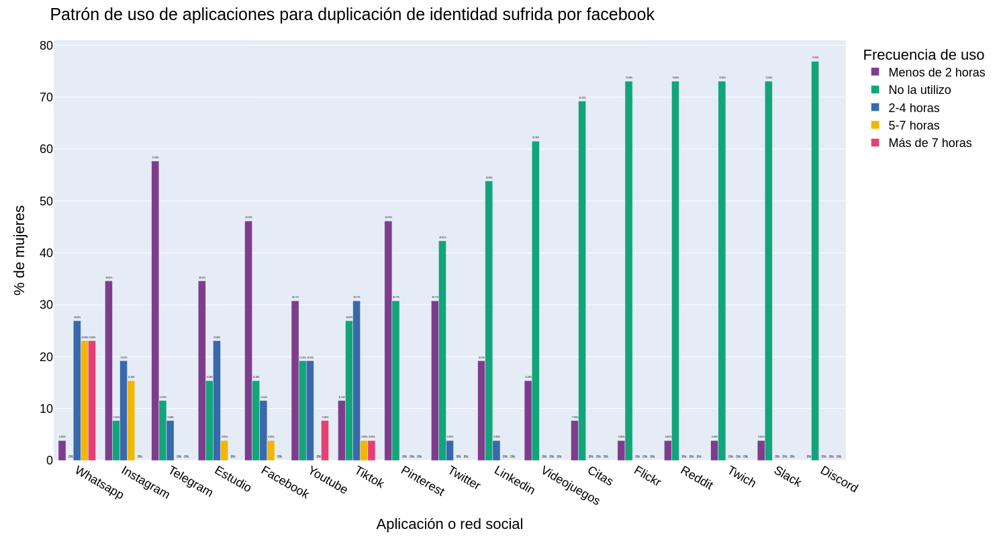

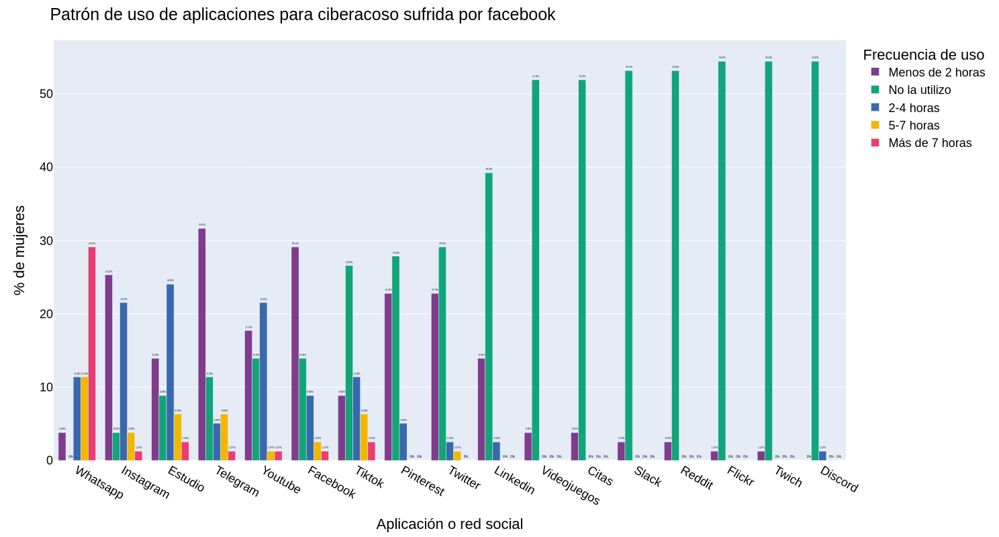

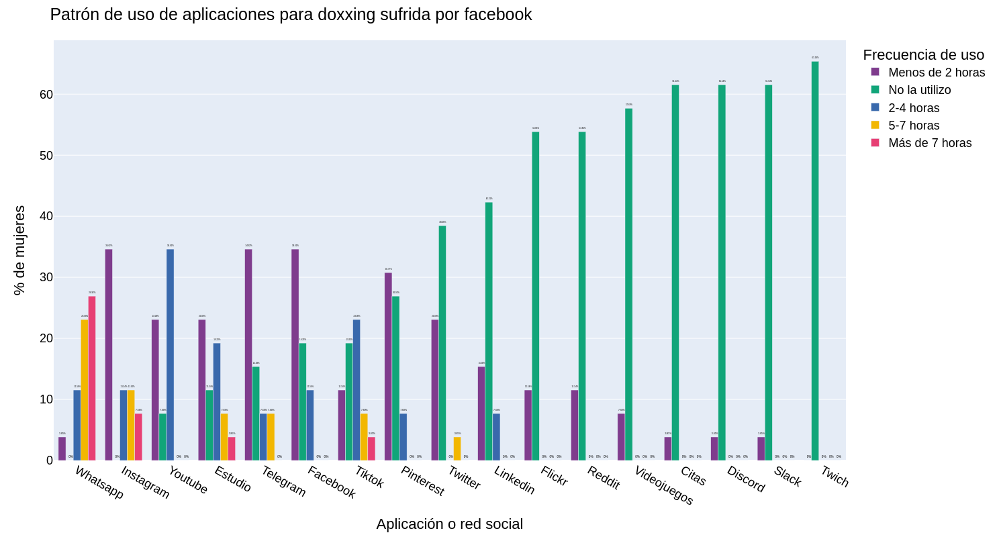

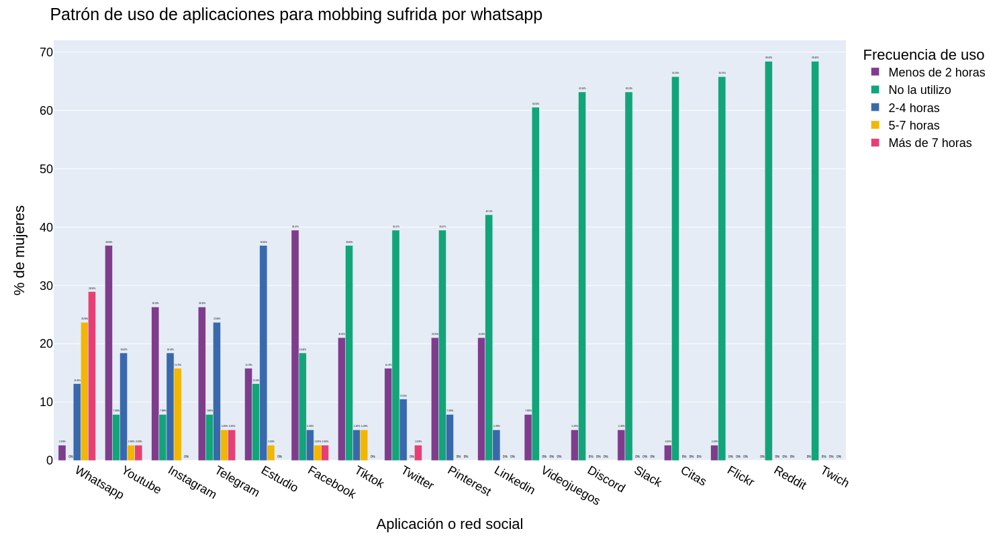

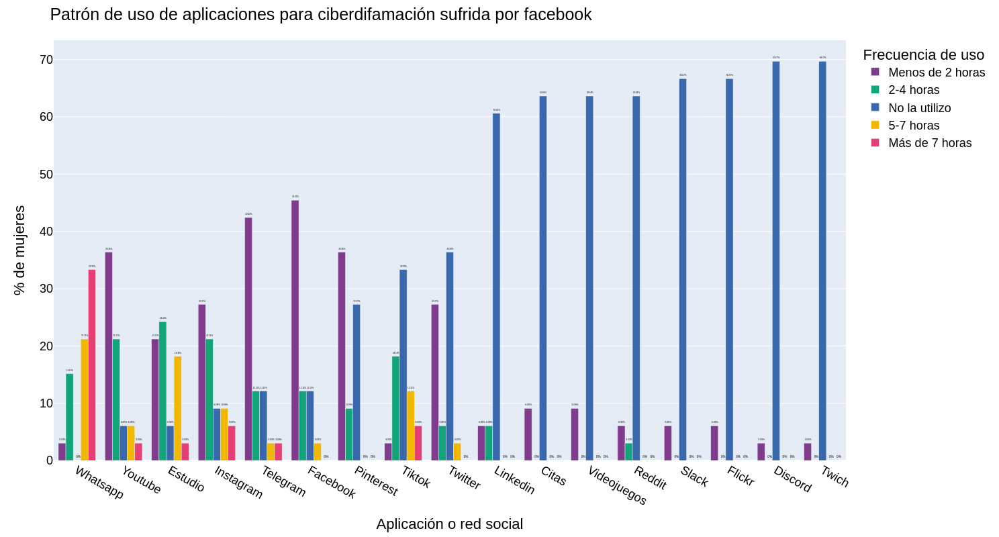

...

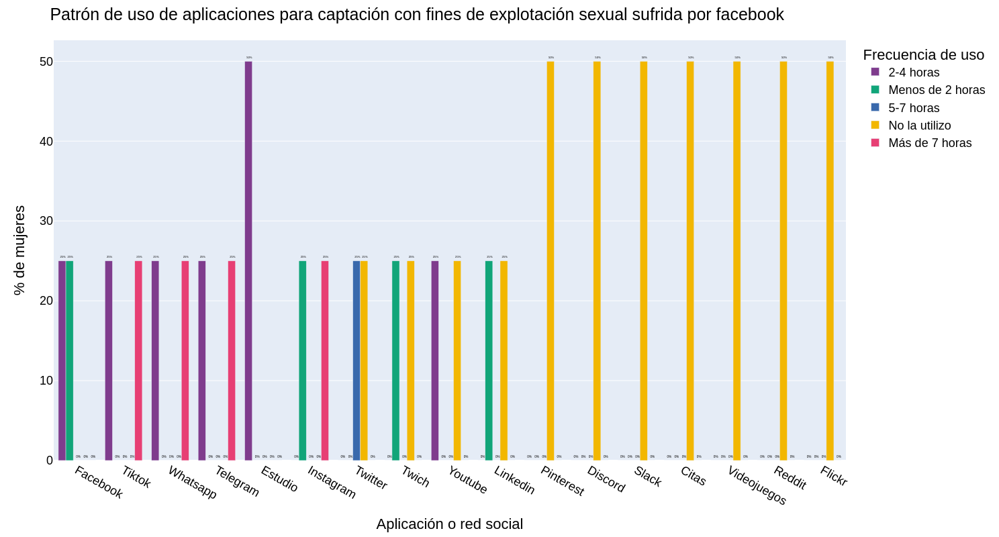

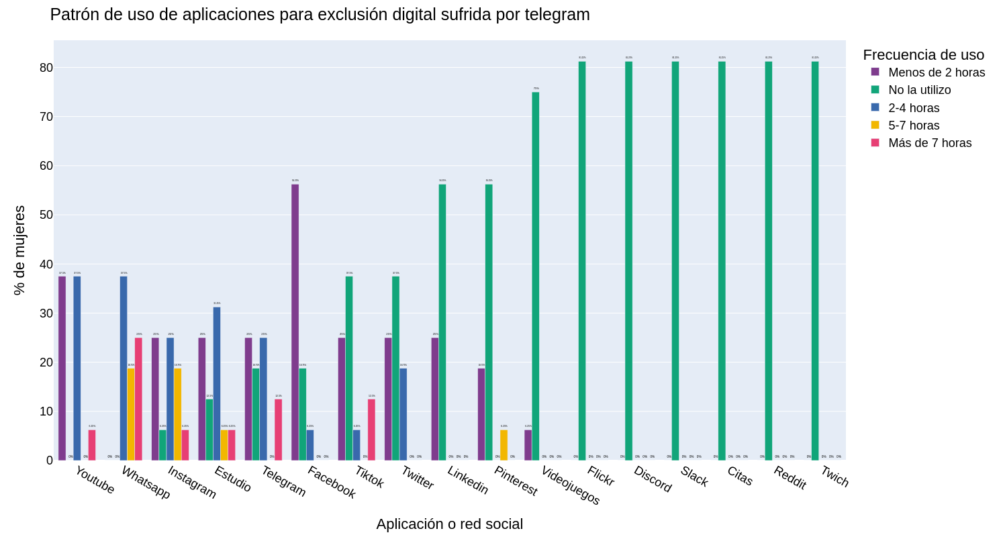

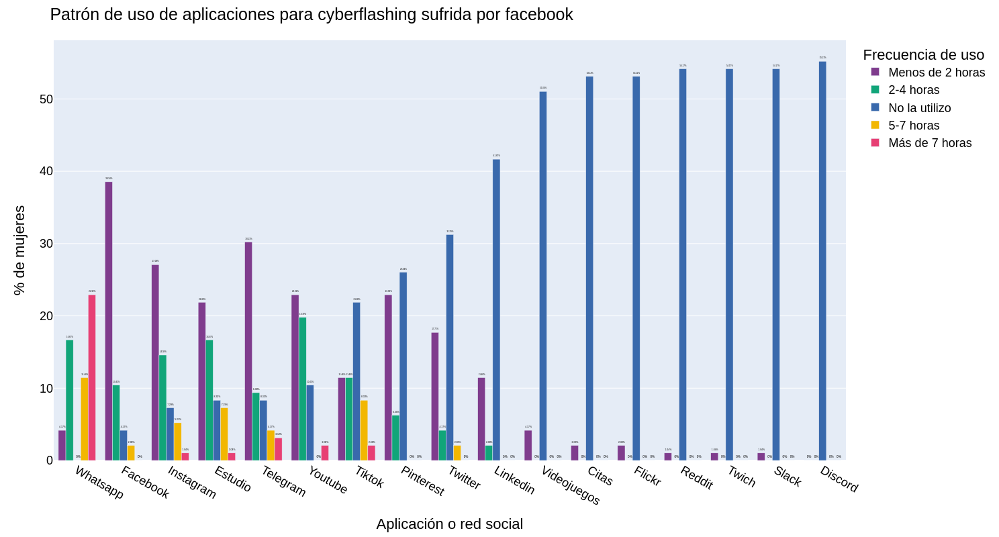

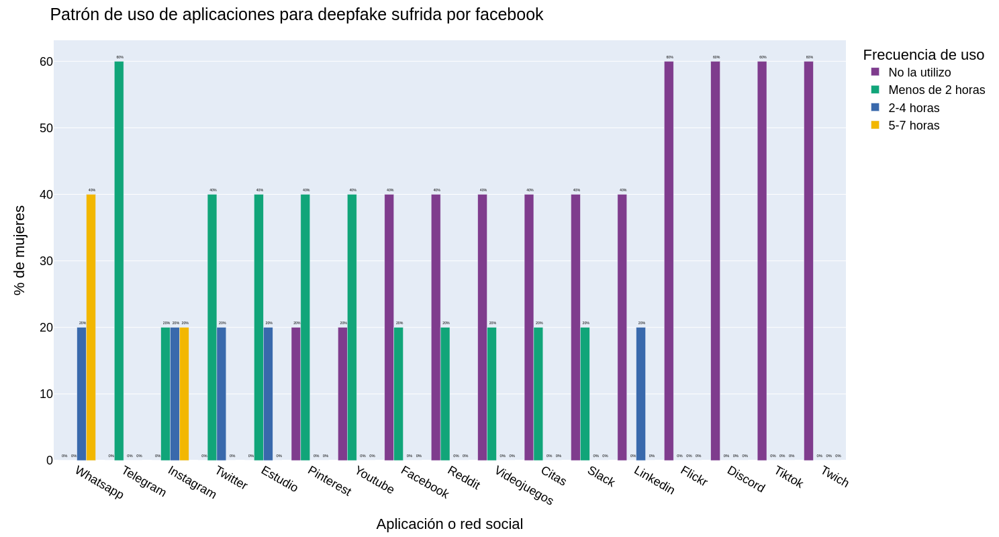

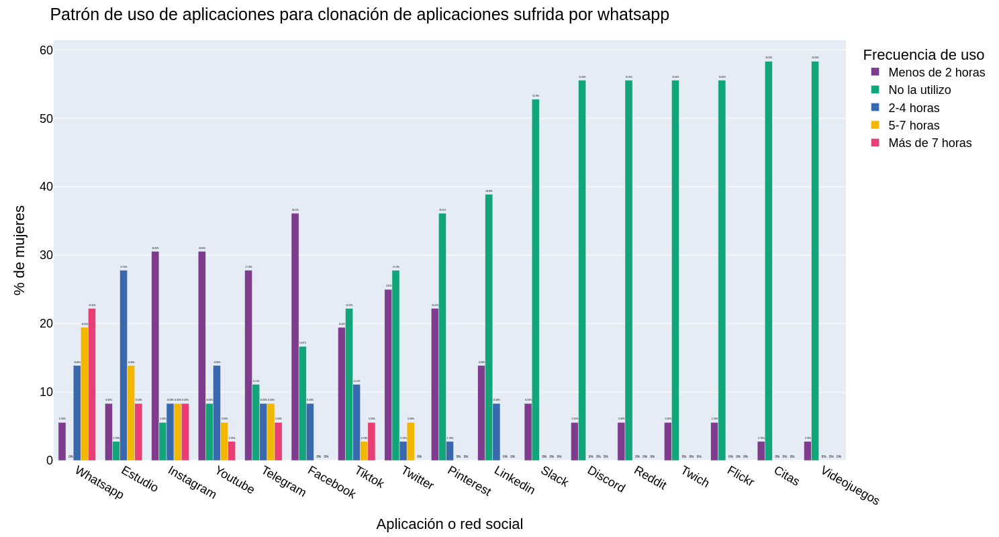

In [260]:
for i, j in zip(dict_medios_medios.keys(), medio_frecuente):
    fig = px.bar(
        dict_medios_medios[i].sort_values("No la utilizo"),
        orientation="v",
        barmode="group",
        color_discrete_sequence=px.colors.qualitative.Bold,
        width=1500,
        height=800,
    )
    fig.update_layout(
        title=f"Patrón de uso de aplicaciones para {i.casefold()} sufrida por {j} ",
        yaxis_title="% de mujeres",
        xaxis_title="Aplicación o red social",
        legend_title="Frecuencia de uso",
        font=dict(
            family="Arial",
            size=18,
            color="black",
        ),
    )
    fig.update_traces(
        textfont_size=18,
        textangle=0,
        textposition="outside",
        cliponaxis=False,
        texttemplate="%{value: 4}%",
    )
    fig.show()
    fig.write_image(f"img/apps{i[:8]}.png")

#### Víctimas y conocimiento del nombre de la violencia que sufrieron

In [261]:
dict_conocimiento_frecuencia = {}
for i in violencias:
    df = datos.query(f"{i} == 1")["vdbg"].value_counts()
    dict_conocimiento_frecuencia[violencias_nombres[i]] = round(df / df.sum() * 100, 2)

In [262]:
df_victima_conocimiento = pd.DataFrame.from_dict(
    dict_conocimiento_frecuencia, orient="index"
).fillna(0)

df_victima_conocimiento.columns.name = "Conocimiento del nombre de la violencia"

df_victima_conocimiento

Conocimiento del nombre de la violencia,Sí,No
Duplicación de identidad,80.77,19.23
Ciberacoso,73.42,26.58
Doxxing,69.23,30.77
Mobbing,65.79,34.21
Ciberdifamación,72.73,27.27
Cibervigilancia (stalking),66.32,33.68
Ciberextorsión,66.67,33.33
Grooming,55.56,44.44
Phishing/Vishing/Smishing,73.08,26.92
Trata de personas en línea,60.00,40.00


Esta tabla contiene la información de las mujeres que sufrieron las violencias y se compara con la respuesta de si conoce o no el nombre.

In [263]:
# data = pd.read_pickle("vdbg_final.pkl")

data = pd.read_csv("datos_final.csv", index_col=0)

In [264]:
parentesco_lista = [
    s for s in list(data.columns) if "parentesco_" in s or "identificacion_" in s
]

In [265]:
data.loc[:, parentesco_lista] = data[parentesco_lista].astype("category")

In [266]:
data.edad = data.edad.astype("category").cat.set_categories(
    ["14-17", "18-25", "26-40", "41-60", "Más de 60"], ordered=True
)

Los siguientes resultados corresponden a los 21 **hombres** que respondieron la encuesta.

In [267]:
data.horas_internet = data.horas_internet.astype("category").cat.set_categories(
    [
        "No lo utilizo diariamente",
        "Menos de 2 horas",
        "2-4 horas",
        "5-7 horas",
        "Más de 7 horas",
    ],
    ordered=True,
)

{{< pagebreak >}}

## Resultados para los hombres

{{< pagebreak >}}

In [268]:
del data

In [269]:
# data = pd.read_pickle("vdbg_final.pkl")

data = pd.read_csv("datos_final.csv", index_col=0)

In [270]:
parentesco_lista = [
    s for s in list(data.columns) if "parentesco_" in s or "identificacion_" in s
]

In [271]:
data.loc[:, parentesco_lista] = data[parentesco_lista].astype("category")

In [272]:
data.edad = data.edad.astype("category").cat.set_categories(
    ["14-17", "18-25", "26-40", "41-60", "Más de 60"], ordered=True
)

In [273]:
data.horas_internet = data.horas_internet.astype("category").cat.set_categories(
    [
        "No lo utilizo diariamente",
        "Menos de 2 horas",
        "2-4 horas",
        "5-7 horas",
        "Más de 7 horas",
    ],
    ordered=True,
)

In [274]:
datos = data.query("sexo == 'Hombre'")

### Rangos de edad

In [275]:
tbl_edad = pd.DataFrame(datos.edad.value_counts()).sort_index()

In [276]:
tbl_edad_porcentaje = (
    round(tbl_edad / tbl_edad.sum() * 100, 2)["count"].astype(str) + " %"
)

In [277]:
fig = px.bar(tbl_edad, text=tbl_edad_porcentaje)
fig.update_layout(
    title="Rangos de edades",
    xaxis_title="Edades",
    yaxis_title="% de hombres",
    font=dict(
        family="Arial",
        size=18,
        color="black",
    ),
    width=1500,
    height=800,
)
fig.update_traces(
    textfont_size=18,
    textangle=0,
    textposition="outside",
    cliponaxis=False,
    showlegend=False,
    marker_color="rgb(157, 178, 191)",
    marker_line_color="white",
)
fig.show()
fig.write_image("img/hombres/edades.png");

### Respuestas por estados


In [278]:
serie_estados = datos.estado.value_counts()

In [279]:
fp = "./Estados_Venezuela/Estados_Venezuela.shp"
df_mapa = gpd.read_file(fp)

In [280]:
ls = []
for i in df_mapa.ESTADO:
    if i in serie_estados.index:
        ls.append(serie_estados.loc[i])
    else:
        ls.append(0)
df_mapa["Hombres"] = ls

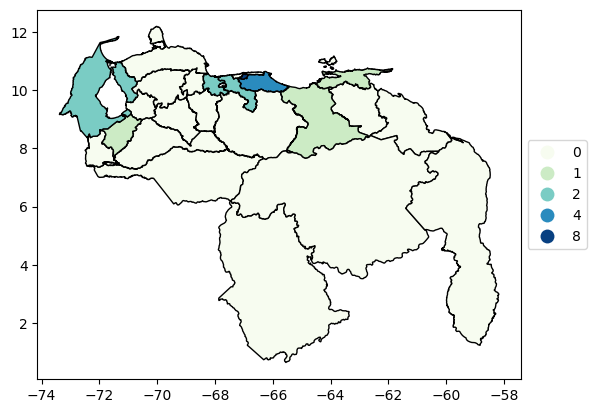

In [281]:
df_mapa.plot(
    "Hombres",
    cmap="GnBu",
    categorical=True,
    edgecolor="black",
    legend=True,
    legend_kwds={"loc": "center left", "bbox_to_anchor": (1, 0.5), "fmt": "{:.0f}"},
);

In [282]:
informacion_estados = pd.DataFrame(serie_estados.sort_index())
informacion_estados["%"] = round(
    informacion_estados / informacion_estados.sum() * 100, 2
)
informacion_estados.rename_axis(index={"estado": "Estado"}, inplace=True)
informacion_estados.rename(columns={"count": "Nº de hombres"})

,Nº de hombres,%
Estado,,
Anzoátegui,1,4.76
Aragua,2,9.52
Carabobo,2,9.52
Distrito Capital,8,38.10
Miranda,4,19.05
Mérida,1,4.76
Sucre,1,4.76
Zulia,2,9.52


{{< pagebreak >}}{{< pagebreak >}}

### Ocupaciones de los hombres

#### Ocupaciones más comunes

In [283]:
df_ocupaciones = (
    pd.DataFrame(datos.ocupacion.value_counts())
    .rename_axis(index={"ocupacion": "Ocupación"})
    .rename(columns={"count": "Nº de hombres"})
)
df_ocupaciones["%"] = round(df_ocupaciones / len(datos) * 100, 2)
df_ocupaciones.drop("Otra")[:10]

,Nº de hombres,%
Ocupación,,
Docente,4,19.05
Estudiante,3,14.29
Ingeniero(a),3,14.29
Empleado(a) Público(a),3,14.29
Abogado(a),2,9.52
Estadístico(a),1,4.76
Médico,1,4.76
Analista,1,4.76
Jubilado(a),1,4.76


En "otros" hay 2 respuestas, que se dividen de la siguiente manera:

In [284]:
pd.DataFrame(datos.ocupacionO.value_counts()).rename_axis(
    index={"ocupacionO": "Ocupación"}
).rename(columns={"count": "N° de hombres"})

,N° de hombres
Ocupación,
Coordinador,1
Gestor de Casos,1


### Horas de uso de internet

In [285]:
tbl_uso_internet = pd.DataFrame(datos.horas_internet.value_counts().sort_index())

In [286]:
tbl_uso_porcentaje = (
    round(tbl_uso_internet / tbl_uso_internet.sum() * 100, 2)["count"].astype(str)
    + " %"
)

In [287]:
fig = px.bar(tbl_uso_internet, text=tbl_uso_porcentaje)
fig.update_layout(
    title="Uso de internet por rangos de tiempo",
    xaxis_title="Tiempo",
    yaxis_title="% de hombres",
    font=dict(
        family="Arial",
        size=18,
        color="black",
    ),
    width=1500,
    height=800,
)
fig.update_traces(
    textfont_size=18,
    textangle=0,
    textposition="outside",
    cliponaxis=False,
    showlegend=False,
    marker_color="rgb(39, 55, 77)",
    marker_line_color="white",
)
fig.show()
fig.write_image("img/hombres/uso_internet.png")

### Principales usos de internet

In [288]:
tbl_usos = pd.DataFrame(
    datos[
        [
            "uso_familia",
            "uso_trabajo",
            "uso_venta",
            "uso_distraer",
            "uso_estudiar",
            "uso_banco",
            "uso_otra",
            "uso_peli",
            "uso_noticias",
        ]
    ].sum()
)

In [289]:
tbl_usos.index = [
    "Comunicarme con familiares y amigos/as",
    "Trabajar",
    "Vender productos",
    "Distraerme",
    "Estudiar o investigar",
    "Realizar operaciones bancarias",
    "Otras actividades",
    "Ver películas y/o series",
    "Ver noticias",
]

In [290]:
tbl_usos_porcentaje = pd.DataFrame(
    round(tbl_usos / tbl_usos.sum() * 100, 2)[0].astype(str) + " %"
)

In [291]:
tbl_usos_concat = pd.concat(
    [tbl_usos, tbl_usos_porcentaje.rename(columns={0: "p"})], axis=1
).sort_values(0)

In [292]:
fig = px.bar(tbl_usos_concat[0], text=tbl_usos_concat.p)
fig.update_layout(
    title="Usos de internet",
    xaxis_title="Actividades",
    yaxis_title="% de hombres",
    font=dict(
        family="Arial",
        size=18,
        color="black",
    ),
    width=1500,
    height=900,
)
fig.update_traces(
    textfont_size=18,
    textangle=0,
    textposition="outside",
    cliponaxis=False,
    showlegend=False,
    marker_color="rgb(39, 55, 77)",
    marker_line_color="white",
)
fig.show()
fig.write_image("img/hombres/usos_internet.png")

En el caso de la respuesta "Otras actividades", se desglosa de la siguiente manera:

In [293]:
pd.DataFrame(datos.uso_otraR.value_counts()).rename_axis(
    index={"uso_otraR": "Otros usos de internet"}
).rename(columns={"count": "Nº de hombres"})

,Nº de hombres
Otros usos de internet,
"Noticias, documentales, trámites legales",1


### Aumento de uso de internet por Covid19

In [294]:
tbl_covid_aumento = datos.covid_aumento.value_counts()

In [295]:
fig = go.Figure(data=[go.Pie(labels=tbl_covid_aumento.index, values=tbl_covid_aumento)])
fig.update_layout(
    title_text="Aumento del uso de internet",
    legend_title="¿Has aumentado tu tiempo de <br> conexión a internet?",
    font=dict(family="Arial", size=18, color="black"),
    width=1500,
    height=800,
)
fig.update_traces(
    marker=dict(
        colors=["rgb(39, 55, 77)", "rgb(82, 109, 130)"],
        line=dict(color="white", width=1),
    )
)
fig.show()
fig.write_image("img/hombres/covid.png")

### Uso de redes sociales/aplicaciones

In [296]:
datos.loc[:, "telegram"] = datos.telegram.apply(str.strip)

In [297]:
redes = [
    "facebook",
    "twitter",
    "instagram",
    "tiktok",
    "discord",
    "slack",
    "citas",
    "videojuegos",
    "whatsapp",
    "telegram",
    "reddit",
    "estudio",
    "linkedin",
    "twich",
    "youtube",
    "pinterest",
    "flickr",
]

dicts = {}
for i in redes:
    dicts[i.capitalize()] = (
        datos[[i]].value_counts().reset_index().set_index(i)["count"]
    )

In [298]:
tbl_aplicaciones = round(
    pd.DataFrame.from_dict(dicts, orient="index").fillna(0)[
        [
            "Menos de 2 horas",
            "2-4 horas",
            "5-7 horas",
            "Más de 7 horas",
            "No la utilizo",
        ]
    ]
    / len(datos)
    * 100,
    2,
)

In [299]:
fig = px.bar(
    tbl_aplicaciones.sort_values("No la utilizo"),
    orientation="h",
    color_discrete_sequence=[
        "rgb(39, 55, 77)",
        "rgb(82, 109, 130)",
        "rgb(102, 102, 102)",
        "rgb(157, 178, 191)",
        "rgb(221, 230, 237)",
    ],
    width=1500,
    height=800,
)
fig.update_layout(
    title="Uso de aplicaciones/redes sociales",
    xaxis_title="% de hombres",
    yaxis_title="Aplicación/red social",
    legend_title="Horas de uso diario",
    font=dict(
        family="Arial",
        size=18,
        color="black",
    ),
)

fig.show()
fig.write_image("img/hombres/uso_apps.png")

### Incidencia de violencias

In [300]:
violencias_nombres = {
    "identidad": "Duplicación de identidad",
    "ciberacoso": "Ciberacoso",
    "doxxing": "Doxxing",
    "mobbing": "Mobbing",
    "ciberdifamacion": "Ciberdifamación",
    "stalking": "Cibervigilancia (stalking)",
    "ciberextorsion": "Ciberextorsión",
    "grooming": "Grooming",
    "phishing_vs": "Phishing/Vishing/Smishing",
    "trata": "Trata de personas en línea",
    "explotacion": "Captación con fines de explotación sexual",
    "exclusion": "Exclusión digital",
    "cyberflashing": "Cyberflashing",
    "deepfake": "Deepfake",
    "clonacion": "Clonación de aplicaciones",
}

In [301]:
violencias = list(violencias_nombres.keys())

In [302]:
dic = {}
for i in violencias:
    datos.loc[:, i] = datos[i].apply(str.strip).apply(str.capitalize)
    dic[violencias_nombres[i]] = datos[[i]].value_counts().sort_index()

In [303]:
tbl_sufrio = pd.DataFrame.from_dict(dic, orient="index").fillna(0)

In [304]:
tbl_sufrio = tbl_sufrio.set_axis(["No", "Sí"], axis=1)

In [305]:
sufrio_porcentaje = round(tbl_sufrio / len(datos) * 100, 2)

In [306]:
fig = px.bar(
    sufrio_porcentaje[["Sí", "No"]].sort_values("Sí"),
    orientation="h",
    text_auto=True,
    color_discrete_map={"Sí": "rgb(39, 55, 77)", "No": "rgb(82, 109, 130)"},
    width=1500,
    height=800,
)
fig.update_layout(
    title="Incidencia de violencias",
    yaxis_title="Violencia",
    xaxis_title="% de hombres",
    legend_title="¿Sufrió la violencia?",
    font=dict(
        family="Arial",
        size=18,
        color="black",
    ),
)
fig.update_traces(
    textfont_size=18,
    textangle=0,
    cliponaxis=False,
    marker_line_color="white",
    texttemplate="%{value: 4} %",
)
fig.show()
fig.write_image("img/hombres/incidencia.png")

In [307]:
for i in violencias:
    datos.loc[:, i].replace(
        [
            "No",
            "Sí",
        ],
        [0, 1],
        inplace=True,
    )

In [308]:
tbl_numero_violencia = pd.DataFrame(
    datos[violencias].T.sum().value_counts()
).sort_index()
tbl_violencia_porcentaje = round(tbl_numero_violencia / len(datos) * 100, 2)

In [309]:
tbl_violencia_porcentaje.index = tbl_violencia_porcentaje.index.astype("string")

In [310]:
fig = px.bar(
    tbl_violencia_porcentaje,
    text_auto=True,
)
fig.update_layout(
    title="Cantidad de violencias sufridas",
    xaxis_title="Nº de violencias sufridas",
    yaxis_title="% de hombres",
    font=dict(
        family="Arial",
        size=18,
        color="black",
    ),
    width=1500,
    height=800,
)
fig.update_traces(
    textfont_size=18,
    textangle=0,
    textposition="outside",
    cliponaxis=False,
    showlegend=False,
    marker_line_color="white",
    marker_color="rgb(39, 55, 77)",
    texttemplate="%{value}%",
)
fig.show()
fig.write_image("img/hombres/numero_violencia.png")

In [311]:
dic_violencias = {}
for i in violencias:
    dic_violencias[i] = [s for s in list(datos.columns)[:-32] if i in s]

#### Resultados para los casos de duplicación de identidad

In [312]:
tbl_identidad = datos.query("identidad == 1")[dic_violencias["identidad"]]

In [313]:
print(
    f"Se han reportado {tbl_identidad.iloc[:, 0].sum()} casos de duplicación de identidad."
)

Se han reportado 4 casos de duplicación de identidad.


In [314]:
frecuencia_identidad = fg.grafico_frecuencia(tbl_identidad, "M")

In [315]:
temporalidad_identidad = fg.grafico_temporalidad(tbl_identidad, "H")

In [316]:
edad_identidad = fg.grafico_edad(tbl_identidad, "Hombre")

In [317]:
parentesco_identidad = fg.grafico_parentesco(tbl_identidad, "H")

In [318]:
sexo_identidad = fg.grafico_sexo_parentesco(tbl_identidad, "H")

Para duplicación de identidad todas las personas agresoras son de sexo Hombre


In [319]:
medios_identidad = fg.grafico_medios(tbl_identidad, "H")[2]

#### Resultados para los casos de ciberacoso

In [320]:
tbl_ciberacoso = datos.query("ciberacoso == 1")[dic_violencias["ciberacoso"]]

In [321]:
print(f"Se han reportado {tbl_ciberacoso.iloc[:, 0].sum()} casos de ciberacoso.")

Se han reportado 5 casos de ciberacoso.


In [322]:
frecuencia_ciberacoso = fg.grafico_frecuencia(tbl_ciberacoso, "H")

In [323]:
temporalidad_ciberacoso = fg.grafico_temporalidad(tbl_ciberacoso, "H")

In [324]:
edad_ciberacoso = fg.grafico_edad(tbl_ciberacoso, "H")

In [325]:
parentesco_ciberacoso = fg.grafico_parentesco(tbl_ciberacoso, "H")

In [326]:
sexo_ciberacoso = fg.grafico_sexo_parentesco(tbl_ciberacoso, "H")

In [327]:
medios_ciberacoso = fg.grafico_medios(tbl_ciberacoso, "H")[2]

#### Resultados para los casos de doxxing

In [328]:
tbl_doxxing = datos.query("doxxing == 1")[dic_violencias["doxxing"]]

In [329]:
print(f"Se han reportado {tbl_doxxing.iloc[:, 0].sum()} casos de doxxing.")

Se han reportado 2 casos de doxxing.


In [330]:
frecuencia_doxxing = fg.grafico_frecuencia(tbl_doxxing, "H")

In [331]:
temporalidad_doxxing = fg.grafico_temporalidad(tbl_doxxing, "H")

Las personas que sufrieron de doxxing, manifiestan que no ocurrió durante los últimos 6 meses


In [332]:
edad_doxxing = fg.grafico_edad(tbl_doxxing, "H")

In [333]:
parentesco_doxxing = fg.grafico_parentesco(tbl_doxxing, "H")

In [334]:
sexo_doxxing = fg.grafico_sexo_parentesco(tbl_doxxing, "H")

Para doxxing todas las personas agresoras son de sexo Hombre


In [335]:
medios_doxxing = fg.grafico_medios(tbl_doxxing, "H")[2]

In [336]:
pd.DataFrame(tbl_doxxing.otraR_doxxing.value_counts()).rename_axis(
    index={"otraR_doxxing": "Otras aplicaciones o redes sociales"}
).rename(columns={"count": "N° de hombres"})

,N° de hombres
Otras aplicaciones o redes sociales,
Buscador de internet Google crome,1


#### Resultados para los casos de mobbing

In [337]:
tbl_mobbing = datos.query("mobbing == 1")[dic_violencias["mobbing"]]

In [338]:
print(f"Se han reportado {tbl_mobbing.iloc[:, 0].sum()} casos de mobbing")

Se han reportado 6 casos de mobbing


In [339]:
frecuencia_mobbing = fg.grafico_frecuencia(tbl_mobbing, "H")

In [340]:
temporalidad_mobbing = fg.grafico_temporalidad(tbl_mobbing, "H")

In [341]:
edad_mobbing = fg.grafico_edad(tbl_mobbing, "H")

In [342]:
parentesco_mobbing = fg.grafico_parentesco(tbl_mobbing, "H")

In [343]:
sexo_mobbing = fg.grafico_sexo_parentesco(tbl_mobbing, "H")

In [344]:
medios_mobbing = fg.grafico_medios(tbl_mobbing, "H")[2]

#### Resultados para los casos de ciberdifamación

In [345]:
tbl_ciberdifamacion = datos.query("ciberdifamacion == 1")[
    dic_violencias["ciberdifamacion"]
]

In [346]:
print(
    f"Se han reportado {tbl_ciberdifamacion.iloc[:, 0].sum()} casos de ciberdifamación."
)

Se han reportado 4 casos de ciberdifamación.


In [347]:
frecuencia_ciberdifamacion = fg.grafico_frecuencia(tbl_ciberdifamacion, "H")

In [348]:
temporalidad_ciberdifamacion = fg.grafico_temporalidad(tbl_ciberdifamacion, "H")

In [349]:
edad_ciberdifamacion = fg.grafico_edad(tbl_ciberdifamacion, "H")

In [350]:
parentesco_ciberdifamacion = fg.grafico_parentesco(tbl_ciberdifamacion, "H")

In [351]:
sexo_ciberdifamacion = fg.grafico_sexo_parentesco(tbl_ciberdifamacion, "H")

In [352]:
medios_ciberdifamacion = fg.grafico_medios(tbl_ciberdifamacion, "H")[2]

#### Resultados para los casos de cibervigilancia (stalking)

In [353]:
tbl_stalking = datos.query("stalking == 1")[dic_violencias["stalking"]]

In [354]:
print(
    f"Se han reportado {tbl_stalking.iloc[:, 0].sum()} casos de cibervigilancia (stalking)."
)

Se han reportado 7 casos de cibervigilancia (stalking).


In [355]:
frecuencia_stalking = fg.grafico_frecuencia(tbl_stalking, "H")

In [356]:
temporalidad_stalking = fg.grafico_temporalidad(tbl_stalking, "H")

In [357]:
edad_stalking = fg.grafico_edad(tbl_stalking, "H")

In [358]:
parentesco_stalking = fg.grafico_parentesco(tbl_stalking, "H")

In [359]:
sexo_stalking = fg.grafico_sexo_parentesco(tbl_stalking, "H")

In [360]:
medios_stalking = fg.grafico_medios(tbl_stalking, "H")[2]

#### Resultados para los casos de ciberextorsión

In [361]:
tbl_ciberextorsion = datos.query("ciberextorsion == 1")[
    dic_violencias["ciberextorsion"]
]

In [362]:
print(
    f"Se han reportado {tbl_ciberextorsion.iloc[:, 0].sum()} casos de ciberextorsión."
)

Se han reportado 4 casos de ciberextorsión.


In [363]:
frecuencia_ciberextorsion = fg.grafico_frecuencia(tbl_ciberextorsion, "H")

In [364]:
temporalidad_ciberextorsion = fg.grafico_temporalidad(tbl_ciberextorsion, "H")

Las personas que sufrieron de ciberextorsion, manifiestan que no ocurrió durante los últimos 6 meses


In [365]:
edad_ciberextorsion = fg.grafico_edad(tbl_ciberextorsion, "H")

In [366]:
parentesco_ciberextorsion = fg.grafico_parentesco(tbl_ciberextorsion, "H")

In [367]:
sexo_ciberextorsion = fg.grafico_sexo_parentesco(tbl_ciberextorsion, "H")

Para ciberextorsión todas las personas agresoras son de sexo Hombre


In [368]:
medios_ciberextorsion = fg.grafico_medios(tbl_ciberextorsion, "H")[2]

#### Resultados para los casos de grooming

In [369]:
tbl_grooming = datos.query("grooming == 1")[dic_violencias["grooming"]]

In [370]:
print(f"Se han reportado {tbl_grooming.iloc[:, 0].sum()} casos de grooming.")

Se han reportado 8 casos de grooming.


In [371]:
frecuencia_grooming = fg.grafico_frecuencia(tbl_grooming, "H")

In [372]:
temporalidad_grooming = fg.grafico_temporalidad(tbl_grooming, "H")

In [373]:
edad_grooming = fg.grafico_edad(tbl_grooming, "H")

In [374]:
parentesco_grooming = fg.grafico_parentesco(tbl_grooming, "H")

In [375]:
sexo_grooming = fg.grafico_sexo_parentesco(tbl_grooming, "H")

Para grooming todas las personas agresoras son de sexo Hombre


In [376]:
medios_grooming = fg.grafico_medios(tbl_grooming, "H")[2]

In [377]:
pd.DataFrame(tbl_grooming.otraR_grooming.value_counts()).rename_axis(
    index={"otraR_grooming": "Otras aplicaciones o redes sociales"}
).rename(columns={"count": "N° de hombres"})

,N° de hombres
Otras aplicaciones o redes sociales,
Chatroomde Digitel,1


#### Resultados para los casos de los casos de phishing/vishing/smishing

In [378]:
tbl_phishing_vs = datos.query("phishing_vs == 1")[dic_violencias["phishing_vs"]]

In [379]:
print(
    f"Se han reportado {tbl_phishing_vs.iloc[:, 0].sum()} casos de phishing/vishing/smishing."
)

Se han reportado 7 casos de phishing/vishing/smishing.


In [380]:
frecuencia_phishing_vs = fg.grafico_frecuencia(tbl_phishing_vs, "H")

In [381]:
temporalidad_phishing_vs = fg.grafico_temporalidad(tbl_phishing_vs, "H")

In [382]:
edad_phishing_vs = fg.grafico_edad(tbl_phishing_vs, "H")

In [383]:
parentesco_phishing_vs = fg.grafico_parentesco(tbl_phishing_vs, "H")

In [384]:
sexo_phishing_vs = fg.grafico_sexo_parentesco(tbl_phishing_vs, "H")

In [385]:
medios_phishing_vs = fg.grafico_medios(tbl_phishing_vs, "H")[2]

#### Resultados para los casos de trata

In [386]:
for i in datos.query("otraR_trata == 'Instagram '").index:
    datos.loc[i, "instagram_trata"] = True

In [387]:
tbl_trata = datos.query("trata == 1")[dic_violencias["trata"]]

In [388]:
print(
    f"Se han reportado {tbl_trata.iloc[:, 0].sum()} casos de trata de persona en línea."
)

Se han reportado 2 casos de trata de persona en línea.


In [389]:
frecuencia_trata = fg.grafico_frecuencia(tbl_trata, "H")

In [390]:
temporalidad_trata = fg.grafico_temporalidad(tbl_trata, "H")

Las personas que sufrieron de trata, manifiestan que sí ocurrió durante los últimos 6 meses


In [391]:
edad_trata = fg.grafico_edad(tbl_trata, "H")

In [392]:
parentesco_trata = fg.grafico_parentesco(tbl_trata, "H")

Las personas que sufrieron de {i} manifiestan que su parentesco con su agresor es: {data.index[0]}.lower()}


In [393]:
medios_trata = fg.grafico_medios(tbl_trata, "H")[2]

#### Resultados para los casos de exclusión

In [394]:
tbl_exclusion = datos.query("exclusion == 1")[dic_violencias["exclusion"]]

In [395]:
print(
    f"Se han reportado {tbl_exclusion.iloc[:, 0].sum()} víctimas de exclusión digital."
)

Se han reportado 3 víctimas de exclusión digital.


In [396]:
frecuencia_exclusion = fg.grafico_frecuencia(tbl_exclusion, "H")

In [397]:
temporalidad_exclusion = fg.grafico_temporalidad(tbl_exclusion, "H")

In [398]:
edad_exclusion = fg.grafico_edad(tbl_exclusion, "H")

Para exclusión no se pregunto por agresor.

In [399]:
medios_exclusion = fg.grafico_medios(tbl_exclusion, "H")[2]

#### Resultados para los casos de cyberflashing

In [400]:
tbl_cyberflashing = datos.query("cyberflashing == 1")[dic_violencias["cyberflashing"]]

In [401]:
print(f"Se han reportado {tbl_cyberflashing.iloc[:, 0].sum()} casos de cyberflashing")

Se han reportado 9 casos de cyberflashing


In [402]:
frecuencia_cyberflashing = fg.grafico_frecuencia(tbl_cyberflashing, "H")

In [403]:
temporalidad_cyberflashing = fg.grafico_temporalidad(tbl_cyberflashing, "H")

In [404]:
edad_cyberflashing = fg.grafico_edad(tbl_cyberflashing, "H")

In [405]:
parentesco_cyberflashing = fg.grafico_parentesco(tbl_cyberflashing, "H")

Las personas que sufrieron de {i} manifiestan que su parentesco con su agresor es: {data.index[0]}.lower()}


In [406]:
medios_cyberflashing = fg.grafico_medios(tbl_cyberflashing, "H")[2]

#### Resultados para los casos de clonación de aplicaciones

In [407]:
tbl_clonacion = datos.query("clonacion == 1")[dic_violencias["clonacion"]]

In [408]:
print(
    f"Se han reportado {tbl_clonacion.iloc[:, 0].sum()} casos de clonación de aplicaciones"
)

Se han reportado 4 casos de clonación de aplicaciones


In [409]:
frecuencia_clonacion = fg.grafico_frecuencia(tbl_clonacion, "H")

In [410]:
temporalidad_clonacion = fg.grafico_temporalidad(tbl_clonacion, "H")

In [411]:
edad_clonacion = fg.grafico_edad(tbl_clonacion, "H")

In [412]:
parentesco_clonacion = fg.grafico_parentesco(tbl_clonacion, "H")

Las personas que sufrieron de {i} manifiestan que su parentesco con su agresor es: {data.index[0]}.lower()}


In [413]:
medios_clonacion = fg.grafico_medios(tbl_clonacion, "H")[2]

### Conocimiento sobre violencia digital basada en género

In [414]:
tbl_vdbg = datos.vdbg.value_counts()

In [415]:
fig = go.Figure(data=[go.Pie(labels=tbl_vdbg.index, values=tbl_vdbg)])
fig.update_layout(
    title_text="Conocimiento de VDBG",
    legend_title="¿Habías escuchado antes el término <br> Violencia Digital Basada en Género?",
    font=dict(family="Arial", size=18, color="black"),
)
fig.update_traces(
    marker=dict(
        colors=["rgb(39, 55, 77)", "rgb(82, 109, 130)"],
        line=dict(color="white", width=1),
    )
)
fig.show()
fig.write_image("img/hombres/vdbg.png")

In [416]:
vdbg_violencias = [s for s in list(datos.columns) if "vdbg_" in s]

In [417]:
con_violencia = pd.DataFrame(
    datos.query("vdbg == 'Sí'")[vdbg_violencias[1:]].T.sum().value_counts()
)
con_violencia.index.name = "Nº de violencias conocidas"
con_violencia["%"] = round(con_violencia / len(datos) * 100, 2)
con_violencia.rename(columns={"count": "Cantidad de hombres"}).sort_index()

,Cantidad de hombres,%
Nº de violencias conocidas,,
1,1,4.76
4,1,4.76
5,1,4.76
6,1,4.76
7,1,4.76
8,2,9.52
10,1,4.76
11,2,9.52
12,1,4.76


In [418]:
tbl_conocimiento_violencia = pd.DataFrame(datos[vdbg_violencias[1:]].sum())
tbl_conocimiento_violencia.index = violencias
tbl_conocimiento_violencia.rename(
    index=violencias_nombres, columns={0: "cantidad"}, inplace=True
)
tbl_conocimiento_violencia = round(tbl_conocimiento_violencia / len(datos) * 100, 2)

In [419]:
fig = px.bar(
    tbl_conocimiento_violencia.sort_values("cantidad", ascending=False),
    y="cantidad",
    x=tbl_conocimiento_violencia.index,
    text_auto=True,
)
fig.update_layout(
    title="Conocimiento de la violencia",
    xaxis_title="Violencia",
    yaxis_title="% de hombres",
    font=dict(
        family="Arial",
        size=18,
        color="black",
    ),
)
fig.update_traces(
    textfont_size=18,
    textangle=0,
    textposition="outside",
    cliponaxis=False,
    showlegend=False,
    marker_color="rgb(82, 109, 130)",
    marker_line_color="white",
    texttemplate="%{value: .4} %",
)
fig.show()
fig.write_image("img/hombres/conocimiento_violencia.png")

### Reacciones de las víctimas al sufrir la(s) violencia(s)

In [420]:
reacciones = [s for s in list(datos.columns) if "reaccion_" in s]

In [421]:
tbl_reacciones = round(pd.DataFrame(datos[reacciones].sum() / len(datos) * 100), 2)

In [422]:
tbl_reacciones.rename(
    index={
        "reaccion_ignorar": "Ignoraron al agresor",
        "reaccion_contar": "Le contaron a un amigo(a) o familiar",
        "reaccion_ayuda": "Acudieron a un centro de ayuda o denuncia",
        "reaccion_reportar": "Reportaron el perfil o publicación en la red social",
        "reaccion_internet": "Redujeron el uso en internet",
        "reaccion_borrar": "Borraron la aplicación donde ocurrió",
        "reaccion_eliminar": "Eliminaron la cuenta de usuario",
        "reaccion_crear": "Crearon una cuenta de usuario distinta",
        "reaccion_bloquear": "Bloquearon a la persona agresora",
        "reaccion_enfrentar": "Enfrentaron a la persona agresora",
    },
    columns={0: "cantidad"},
    inplace=True,
)

In [423]:
fig = px.bar(
    tbl_reacciones.sort_values("cantidad", ascending=False),
    y=tbl_reacciones["cantidad"],
    x=tbl_reacciones.index,
    text_auto=True,
)
fig.update_layout(
    title="Reacción de la víctima al sufrir la(s) violencia(s)",
    xaxis_title="Violencia",
    yaxis_title="Nº de Hombres",
    font=dict(
        family="Arial",
        size=18,
        color="black",
    ),
)
fig.update_traces(
    textfont_size=18,
    textangle=0,
    textposition="outside",
    cliponaxis=False,
    showlegend=False,
    marker_color="rgb(157, 178, 191)",
    marker_line_color="white",
    texttemplate="%{value: .4} %",
)
fig.show()
fig.write_image("img/hombres/reaccion_violencia.png")

### Conocimiento de víctimas

In [424]:
tbl_victima = datos.victima.value_counts()

In [425]:
fig = go.Figure(data=[go.Pie(labels=tbl_victima.index, values=tbl_victima)])
fig.update_layout(
    title_text="Conocimiento de Víctimas",
    legend_title="¿Conoces a alguna mujer que haya <br> sido víctima de violencia digital?",
)
fig.update_traces(
    marker=dict(
        colors=["rgb(39, 55, 77)", "rgb(82, 109, 130)"],
        line=dict(color="white", width=1),
    )
)
fig.show()
fig.write_image("img/hombres/victima.png")

In [426]:
num_victimas = pd.DataFrame(datos.numero_victima.value_counts())

In [427]:
fig = px.bar(
    num_victimas.sort_index(),
    y=num_victimas.sort_index()["count"],
    x=num_victimas.sort_index().index.values,
    text=round(num_victimas.sort_index() / len(datos) * 100, 2)["count"],
)
fig.update_layout(
    title="Cantidad de víctimas conocidas",
    xaxis_title="Nº de victimas",
    yaxis_title="% de hombres",
    font=dict(
        family="Arial",
        size=18,
        color="black",
    ),
)
fig.update_traces(
    textfont_size=18,
    textangle=0,
    textposition="outside",
    cliponaxis=False,
    showlegend=False,
    marker_color="rgb(82, 109, 130)",
    marker_line_color="white",
    texttemplate="%{text: .4} %",
)
fig.show()
fig.write_image("img/hombres/num_victimas.png")

### Conocimiento de leyes y normas

In [428]:
tbl_leyes = datos.leyes_normas.value_counts()

In [429]:
fig = go.Figure(data=[go.Pie(labels=tbl_leyes.index, values=tbl_leyes)])
fig.update_layout(
    title_text="Conocimiento de Leyes y Normas",
    legend_title="¿Conoces leyes o normativas en el país <br> que contemplan las violencias digitales?",
)
fig.update_traces(
    marker=dict(
        colors=["rgb(39, 55, 77)", "rgb(82, 109, 130)"],
        line=dict(color="white", width=1),
    )
)
fig.show()
fig.write_image("img/hombres/ley.png")

### Interacciones entre ciertos ítems de la encuesta

#### Tipos de violencia y edad en que ocurrió por primera vez

In [430]:
edades_violencias = [s for s in list(datos.columns) if "edad_" in s]

In [431]:
lista_edades_violencias = []
for i in edades_violencias:
    j = (
        pd.cut(
            datos[edades_violencias].loc[:, i],
            bins=[0, 10, 15, 18, 25, 30, 40, 50, 60, 75],
            right=False,
        )
        .value_counts()
        .sort_index()
    )
    j = j.reset_index()
    for k in violencias_nombres.keys():
        if k in j.columns[0]:
            j["violencia"] = [violencias_nombres[k]] * len(j)
    j = j.rename(columns={j.columns[0]: "Edad"})
    lista_edades_violencias.append(j)

In [432]:
tbl_edades_primera_vez = pd.concat(lista_edades_violencias, join="inner").reset_index(
    drop=True
)

In [433]:
tbl_edades_primera_vez.Edad = tbl_edades_primera_vez.Edad.astype("str")

In [434]:
l_ = []
for i in lista_edades_violencias:
    j = round(i["count"] / i["count"].sum() * 100, 3)
    i["count"] = j
    l_.append(i)

In [435]:
edades_primera_vez = (
    pd.concat(l_, join="inner")
    .reset_index(drop=True)
    .rename_axis(columns={"violencia": "Violencia"})
)

In [436]:
edades_primera_vez.Edad = edades_primera_vez.Edad.astype("str")

In [437]:
fig = px.bar(
    edades_primera_vez,
    x="Edad",
    y="count",
    color="violencia",
    title="Tasa de incidencia por grupo etario según tipo de violencia",
    barmode="group",
    color_discrete_sequence=px.colors.qualitative.Prism_r,
    width=1200,
    height=600,
)
fig.update_yaxes(title="% de hombres")
fig.update_xaxes(
    title="Rangos de edad",
    labelalias={
        "[0, 10)": "0-9",
        "[10, 15)": "10-14",
        "[15, 18)": "15-17",
        "[18, 25)": "18-24",
        "[25, 30)": "24-29",
        "[30, 40)": "30-39",
        "[40, 50)": "40-49",
        "[50, 60)": "50-59",
        "[60, 75)": "60 y más",
    },
)
fig.show()
fig.write_image("img/violencia_edad2.png")

#### Tipo de violencia según el medio por el cual ocurrió

In [438]:
lista_medios_hombres = [s for s in list(vars()) if "medios_" in s]
ls_medios = []
for i in [s for s in list(vars()) if "medios_" in s]:
    df = vars()[i]
    ls_medios.append(df)

In [439]:
lista_df_medios_hombres = []
for df, i in zip(ls_medios, lista_medios):
    tbl = pd.DataFrame(df)
    if i.split("_")[1] in violencias_nombres.keys():
        l_violencia = [violencias_nombres[i.split("_")[1]]] * len(df)
    else:
        l_violencia = ["Phishing/Vishing/Smishing"] * len(df)
    tbl["violencia"] = l_violencia
    tbl.rename(columns={0: "cantidad"}, inplace=True)
    tbl.reset_index(inplace=True)
    tbl.rename(columns={"index": "Medio"}, inplace=True)
    lista_df_medios.append(tbl)

In [440]:
tbl_violencia_medio = pd.concat(lista_df_medios)

In [441]:
tbl_violencia_medio.reset_index(drop=True, inplace=True)

In [442]:
tbl_violencia_medio = tbl_violencia_medio.astype(
    {"cantidad": "float", "violencia": "str", "Medio": "str"}
)

In [443]:
fig = px.bar(
    tbl_violencia_medio.sort_values("cantidad", ascending=False),
    x="cantidad",
    y="violencia",
    color="Medio",
    title="Tipo de violencia según el medio por el cual ocurrió",
    barmode="stack",
    orientation="h",
    color_discrete_sequence=px.colors.qualitative.Antique_r,
    width=1600,
    height=600,
)
fig.update_yaxes(title="Violencia")
fig.update_xaxes(title="% de hombres")
fig.show()
fig.write_image("img/hombres/violencia_medio1.png")

#### Parentesco de la persona agresora con las mujeres que han sufrido violencias

In [444]:
lista_df_parentescos = [
    parentesco_identidad[2],
    parentesco_ciberacoso[2],
    parentesco_doxxing[2],
    parentesco_ciberdifamacion[2],
    parentesco_stalking[2],
    parentesco_ciberextorsion[2],
    parentesco_cyberflashing[2],
    parentesco_clonacion[2],
]

In [445]:
parentescos_ = [
    "identidad",
    "ciberacoso",
    "doxxing",
    "ciberdifamacion",
    "stalking",
    "ciberextorsion",
    "explotacion",
    "cyberflashing",
    "deepfake",
    "clonacion",
]

In [446]:
for i, j in zip(lista_df_parentescos, parentescos_):
    if j in violencias_nombres.keys():
        ls_index = [violencias_nombres[j]] * len(i)
    i["violencia"] = ls_index

In [447]:
tbl_parentesco_ = pd.concat(lista_df_parentescos)

In [448]:
tbl_parentesco_.reset_index(inplace=True)

In [449]:
fig = px.bar(
    tbl_parentesco_,
    x="violencia",
    y="count",
    color="parentesco",
    title="Parentesco del agresor con los hombres que han sufrido violencias",
    barmode="group",
    color_discrete_sequence=px.colors.qualitative.Prism_r,
    width=1200,
    height=600,
)
fig.update_layout(
    legend_title="Parentesco con el agresor(a):",
    font=dict(family="Arial", size=18, color="black"),
)
fig.update_xaxes(title="Violencia")
fig.update_yaxes(title="% de hombres")
fig.show()
fig.write_image("img/hombres/violencia_parentesco1.png")

NOTA: Para las siguientes violencias la pregunta sobre parentesco se reformulo a si logró o no identificar el agresor.

In [450]:
parentesco_violencia = tbl_parentesco_.pivot(
    index="violencia", columns="parentesco", values="count"
).fillna(0)

In [451]:
tbl_grooPt = (
    pd.concat(
        [parentesco_grooming[2], parentesco_phishing_vs[2], parentesco_trata[2]],
        axis=1,
        keys=["Grooming", "Phishing", "Trata"],
    )
    .T.reset_index(level=1, drop=True)
    .fillna(0)
)
tbl_grooPt

,No,Sí
Grooming,7.0,1.0
Phishing,5.0,2.0
Trata,2.0,0.0


NOTA: Para mobbing la víctima por la naturaleza de la agresión conoce a su agresor(a).

In [452]:
tbl_parentesco_mobbing = parentesco_mobbing[1]

In [453]:
tbl_parentesco_mobbing.astype({"count": "int"}).rename_axis(
    index={"parentesco_mobbing": "Relación laboral"}
).rename(columns={"count": "N° de hombres"})

,N° de hombres
Relación laboral,
Tu compañero(a),3
Un(a) subalterno(a),2
Un(a) jefe(a),1


#### Identificación de la persona agresora

In [454]:
tbl_identificacion_si = round(
    pd.DataFrame(
        parentesco_violencia[
            [
                "Fue mi ex-pareja en ese momento",
                "Fue un compañero(a) de trabajo",
                "No conocía a quien me agredió, pero le identifiqué",
                "Teníamos una amistad",
            ]
        ].sum(1)
    ).rename(columns={0: "Sí"}),
    2,
)

In [455]:
tbl_identificacion_no = pd.DataFrame(
    parentesco_violencia["No le pude identificar"]
).rename(columns={"No le pude identificar": "No"})

In [456]:
tabla_identificacion = pd.concat(
    [tbl_identificacion_si.join(tbl_identificacion_no), tbl_grooPt]
)

In [457]:
porcentaje_identificacion = round(
    (tabla_identificacion.T / tabla_identificacion.sum(1) * 100).T, 2
).fillna(0)

In [458]:
fig = px.bar(
    porcentaje_identificacion,
    barmode="group",
    text_auto="True",
    color_discrete_map={"Sí": "rgb(39, 55, 77)", "No": "rgb(82, 109, 130)"},
    width=1200,
    height=600,
)
fig.update_layout(
    title="Identificación del agresor(a)",
    xaxis_title="Violencia",
    yaxis_title="% de hombres",
    legend_title="¿Identificó al agresor(a)?",
    font=dict(
        family="Arial",
        size=18,
        color="black",
    ),
)
fig.update_traces(
    textfont_size=18,
    textangle=0,
    textposition="outside",
    cliponaxis=False,
    texttemplate="%{value} %",
)

fig.show()
fig.write_image("img/hombres/id_agresor.png")

#### Sexo del agresor por tipo de violencia

In [459]:
variables_sexo = [
    "sexo_identidad",
    "sexo_ciberacoso",
    "sexo_doxxing",
    "sexo_mobbing",
    "sexo_ciberdifamacion",
    "sexo_stalking",
    "sexo_ciberextorsion",
    "sexo_grooming",
    "sexo_phishing_vs",
]

In [460]:
sexo_violencias = []
names_ = []
for i in variables_sexo:
    df = vars()[i]
    names_.append(df[1].index.name.split)
    sexo_violencias.append(df[1])

In [461]:
tbl_sexo_violencias = (
    pd.concat(
        sexo_violencias,
        join="outer",
        axis=1,
        keys=[
            "Duplicación de identidad",
            "Ciberacoso",
            "Doxxing",
            "Mobbing",
            "Ciberdifamación",
            "Cibervigilancia (stalking)",
            "Ciberextorsión",
            "Grooming",
            "Phishing/Vishing/Smishing",
            "Clonación",
        ],
    )
    .T.reset_index(1, drop=True)
    .fillna(0)
)

In [462]:
sexo_porcentaje = round((tbl_sexo_violencias.T / tbl_sexo_violencias.sum(1) * 100).T, 2)

In [463]:
fig = px.bar(
    sexo_porcentaje,
    barmode="group",
    color_discrete_sequence=[
        "rgb(39, 55, 77)",
        "rgb(82, 109, 130)",
        "rgb(157, 178, 191)",
    ],
    width=1200,
    height=600,
    text_auto=True,
)
fig.update_layout(
    title="Sexo del agresor por tipo de violencia",
    xaxis_title="Violencia",
    yaxis_title="% de hombres",
    legend_title="Sexo del agresor",
    font=dict(
        family="Arial",
        size=18,
        color="black",
    ),
)
fig.update_traces(
    textfont_size=18,
    textangle=0,
    textposition="outside",
    cliponaxis=False,
    texttemplate="%{value: } %",
)

fig.show()
fig.write_image("img/hombres/sexo_agresor_violencia.png")

In [464]:
cruce = porcentaje_identificacion.join(sexo_porcentaje)

In [465]:
cruce.columns = pd.MultiIndex.from_tuples(
    [
        ("Sí", "%"),
        ("No", "%"),
        ("Sí", "Mujer"),
        ("Sí", "Hombre"),
        ("Sí", "Un grupo de personas"),
    ]
)

In [466]:
variables = [
    s
    for s in tbl_identidad.columns
    if s.startswith("sexo_") or s.startswith("parentesco_")
]

In [467]:
lista = []
for j, k in zip(tbl_identidad[variables[0]], tbl_identidad[variables[1]]):
    if j != "No le pude identificar" and j != "No":
        lista.append((j, k))
df = pd.DataFrame(lista, columns=["Parentesco", "Sexo"]).value_counts()

In [468]:
dic_sexo = {}
for i in [s for s in violencias if s != "exclusion"]:
    lista = []
    g = datos.query(f"{i} == 1")
    for j, k in zip(g[dic_violencias[i][4]], g[dic_violencias[i][5]]):
        if j != "No le pude identificar" and j != "No":
            lista.append((j, k))
    dic_sexo[i] = pd.DataFrame(lista, columns=["Parentesco", "Sexo"]).value_counts()

In [469]:
for i in [s for s in violencias if s != "exclusion"]:
    lista = []
    g = datos.query(f"{i} == 1")
    for j, k in zip(g[dic_violencias[i][4]], g[dic_violencias[i][5]]):
        if j != "No le pude identificar" and j != "No":
            lista.append((j, k))
    dic_sexo[i] = pd.DataFrame(lista, columns=["Parentesco", "Sexo"]).value_counts()

#### Sexo del agresor(a) y parentesco con la víctima por tipo de violencia

In [470]:
dic_sexo = {}
for i in [s for s in violencias if s != "exclusion"]:
    lista = []
    g = datos.query(f"{i} == 1")
    for j, k in zip(g[dic_violencias[i][4]], g[dic_violencias[i][5]]):
        if j != "No le pude identificar" and j != "No":
            lista.append((i, j, k))
    dic_sexo[i] = pd.DataFrame(
        lista, columns=["Violencia", "Parentesco", "Sexo"]
    ).value_counts()

In [471]:
lista_sexo = [
    dic_sexo[i].reset_index(level=0, drop=True)
    for i in dic_sexo
    if i
    in [
        "identidad",
        "ciberacoso",
        "doxxing",
        "ciberdifamacion",
        "stalking",
        "ciberextorsion",
        "explotacion",
        "cyberflashing",
        "deepfake",
        "clonacion",
    ]
]

In [472]:
lista_parentesco_sexo = [
    round(dic_sexo[i] / dic_sexo[i].sum() * 100, 2).reset_index()
    for i in dic_sexo
    if i
    in [
        "identidad",
        "ciberacoso",
        "doxxing",
        "ciberdifamacion",
        "stalking",
        "ciberextorsion",
        "explotacion",
        "cyberflashing",
        "deepfake",
        "clonacion",
    ]
]

In [473]:
porcentaje_parentesco_sexo = pd.concat(lista_parentesco_sexo)

In [474]:
porcentaje_parentesco_sexo.Violencia.replace(violencias_nombres, inplace=True)

In [475]:
porcentaje_parentesco_sexo.reset_index(drop=True, inplace=True)

In [476]:
fig = px.bar(
    porcentaje_parentesco_sexo,
    x="Parentesco",
    y="count",
    color="Sexo",
    barmode="group",
    facet_col="Violencia",
    facet_col_wrap=2,
    color_discrete_map={"Mujer": "rgb(39, 55, 77)", "Hombre": "rgb(82, 109, 130)"},
    width=1000,
    height=1500,
    text_auto=True,
)
fig.update_layout(
    title="Sexo del agresor y parentesco de la víctima por tipo de violencia",
    legend_title="Sexo del agresor",
    font=dict(
        family="Arial",
        size=18,
        color="black",
    ),
)
fig.update_traces(
    textfont_size=18,
    textangle=0,
    textposition="outside",
    cliponaxis=False,
    texttemplate="%{value} %",
)
fig.for_each_annotation(lambda a: a.update(text=a.text.split("=")[-1]))
fig.for_each_yaxis(lambda y: y.update(title=""))
fig.add_annotation(
    x=-0.07,
    y=0.5,
    text="Porcentaje de agresores",
    textangle=-90,
    xref="paper",
    yref="paper",
)
fig.show()
fig.write_image("img/hombres/violencia_parentesco_sexo.png")

In [477]:
tbl_parentco_sexo = (
    pd.concat(
        lista_sexo,
        join="outer",
        keys=[
            "identidad",
            "ciberacoso",
            "doxxing",
            "ciberdifamacion",
            "stalking",
            "ciberextorsion",
            "explotacion",
            "cyberflashing",
            "deepfake",
            "clonacion",
        ],
        axis=1,
    )
    .fillna(0)
    .sort_index(level=0)
    .T
)

#### Sexo del agresor(a) y parentesco con la víctima por tipo de violencia: individual

In [478]:
sp_df = []
lista_para_graficar = []
for i in lista_parentesco_sexo:
    df = i.pivot(index="Parentesco", columns="Sexo", values="count").fillna(0)
    if "Hombre" in df.columns:
        df.Hombre = df.Hombre * -1
        sp_df.append(df)
        lista_para_graficar.append(i)

In [479]:
for i, j in zip(sp_df, lista_para_graficar):
    v = j.Violencia[0]
    if len(i.columns) < 2:
        print(f"El sexo de las personas agresoras es {i.columns.values} para {v}")
    else:
        if v in violencias_nombres.keys():
            # Creating instance of the figure
            fig = go.Figure()

            # Adding Male data to the figure
            fig.add_trace(
                go.Bar(
                    y=i.index,
                    x=i.Hombre,
                    name="Hombre",
                    orientation="h",
                    text=-1 * i.Hombre.values.astype("float"),
                    marker_color="rgb(39, 55, 77)",
                )
            )

            # Adding Female data to the figure
            fig.add_trace(
                go.Bar(
                    y=i.index,
                    x=i.Mujer,
                    name="Mujer",
                    orientation="h",
                    text=i.Mujer,
                    marker_color="rgb(82, 109, 130)",
                )
            )

            # Updating the layout for our graph
            fig.update_layout(
                title=" ".join(
                    [
                        "Sexo del agresor y parentesco con la víctima de",
                        violencias_nombres[v].casefold(),
                    ]
                ),
                legend_title="Sexo del agresor",
                title_font_size=22,
                barmode="relative",
                bargap=0.0,
                bargroupgap=0.5,
                xaxis=dict(
                    title="% de hombres",
                    title_font_size=14,
                    tickvals=[-100, -50, 0, 0, 50, 100],
                    ticktext=["100", "50", "0", "0", "50", "100"],
                ),
                width=1200,
                height=400,
                margin=dict(l=30),
                font=dict(
                    family="Arial",
                    size=18,
                    color="black",
                ),
            )
            fig.update_traces(
                textfont_size=10,
                textangle=0,
                textposition="outside",
                cliponaxis=False,
                texttemplate="%{text: 4}%",
            )
            fig.show()
            fig.write_image("".join(["img/hombres/piramide_", v, ".png"]))

El sexo de las personas agresoras es ['Hombre'] para identidad


El sexo de las personas agresoras es ['Hombre'] para doxxing


El sexo de las personas agresoras es ['Hombre'] para ciberextorsion


In [480]:
veces_violencias = [s for s in list(datos.columns) if "veces_" in s]

In [481]:
violencias_6 = [s for s in list(datos.columns) if "6_" in s]

In [482]:
r_inf = []
r_sup = []
for i in datos["edad"]:
    if i == "Más de 60":
        r_inf.append(60)
        r_sup.append(100)
    else:
        r_inf.append(int(i.split("-")[0]))
        r_sup.append(int(i.split("-")[1]))

In [483]:
datos["r_inf"] = r_inf

In [484]:
datos["r_sup"] = r_sup

#### Violencias por ocupación

In [485]:
dict_violencias_ocupaciones = {}
for i in violencias:
    df = datos.query(f"{i} == 1 and ocupacion != 'Otra'")["ocupacion"].value_counts()
    df = round(df[:10] / df.sum() * 100, 2)
    dict_violencias_ocupaciones[violencias_nombres[i]] = df

In [486]:
tbl_vo = pd.DataFrame.from_dict(dict_violencias_ocupaciones, orient="index").fillna(0)

In [487]:
fig = px.bar(
    tbl_vo.sort_values("Abogado(a)"),
    orientation="h",
    color_discrete_sequence=px.colors.qualitative.Antique_r,
    width=1200,
    height=600,
)
fig.update_layout(
    title="Ocupaciones más frecuentes por violencia sufrida",
    xaxis_title="% de hombres",
    yaxis_title="Violencia",
    legend_title="Ocupaciones",
    font=dict(
        family="Arial",
        size=18,
        color="black",
    ),
)

fig.show()
fig.write_image("img/hombres/violencia_ocupacion.png")

#### Violencias por estados

In [488]:
for i in violencias:
    df_ = datos.query(f"{i} == 1")["estado"].value_counts()
    df = df_ / df_.sum() * 100

    lista_valores = []
    for j in df_mapa.ESTADO:
        if j in df.index:
            lista_valores.append(df.loc[j])
        else:
            lista_valores.append(0)
    df_mapa[violencias_nombres[i]] = lista_valores

In [489]:
tbl_violencia_estado = df_mapa.drop(columns="Hombres")

In [490]:
tbl_ve = round(
    pd.melt(
        tbl_violencia_estado,
        id_vars=["ESTADO"],
        value_vars=[violencias_nombres[s] for s in violencias_nombres.keys()],
        var_name="violencia",
        value_name="porcentaje",
    )
    .pivot(index="violencia", columns="ESTADO", values="porcentaje")
    .sort_index(axis=0),
    2,
)

In [491]:
fig = px.bar(
    tbl_ve.sort_index(axis=1),
    orientation="h",
    color_discrete_sequence=px.colors.qualitative.Antique_r,
    width=1500,
    height=800,
)
fig.update_layout(
    title="Ubicación de las víctimas por violencia sufrida",
    xaxis_title="% de hombres",
    yaxis_title="Violencia",
    legend_title="Estado",
    font=dict(
        family="Arial",
        size=17,
        color="black",
    ),
)
fig.update_traces(
    textfont_size=18,
    textangle=0,
    cliponaxis=False,
    marker_line_color="white",
    texttemplate="%{value: 4} %",
)
fig.show()
fig.write_image("img/hombres/violencia_estado.png")

#### Promedio de incidencias

In [492]:
round(
    (tbl_numero_violencia.index * tbl_numero_violencia["count"]).sum()
    / tbl_numero_violencia.sum().iloc[0],
    2,
)

3.1

En promedio, una mujer es víctima de 3 violencias.

#### Cantidad de veces en que la víctima reporta haber sufrido la violencia

In [493]:
repeticiones = []
for j in [i for i in list(vars().keys()) if "frecuencia_" in i]:
    df = vars()[j][2].rename(columns={"count": fg.violencias_names[j.split("_")[1]]})
    df.rename(index={"Sólo una vez": "Solo una vez"}, inplace=True)
    repeticiones.append(df)

In [494]:
tbl_repeticiones = pd.concat(repeticiones, axis=1).fillna(0).T

In [495]:
fig = px.bar(
    tbl_repeticiones.sort_values("Solo una vez"),
    orientation="h",
    color_discrete_sequence=px.colors.qualitative.Antique_r,
    width=1500,
    height=800,
)
fig.update_layout(
    title="Cantidad de veces que la víctima reporta haber sufrido la violencia",
    xaxis_title="% de hombres",
    yaxis_title="Violencia",
    legend_title="Frecuencias",
    font=dict(
        family="Arial",
        size=18,
        color="black",
    ),
)
fig.update_traces(
    textfont_size=18,
    textangle=0,
    cliponaxis=False,
    marker_line_color="white",
    texttemplate="%{value: 4} %",
)
fig.show()
fig.write_image("img/hombres/repeticiones_violencia.png")

#### Patrón de uso de aplicaciones por tipo de violencias y según medio más frecuente por el que ocurrió

In [496]:
dict_medios_medios = {}
medio_frecuente = []
for i in violencias:
    df = datos.query(f"{i} == 1")
    if len(df) != 0:
        variable = [s for s in df.columns if "".join(["medio_", i]) in s]
        start_cols = list(range(23, 40))
        var_idx = df.columns.get_loc(variable[0])
        end_col = df.columns.get_loc("".join(["otraR_", i]))

        # concatenar rangos de columnas con np.r_[]
        col_range = np.r_[start_cols, var_idx + 1 : end_col]

        # seleccionar las columnas del DataFrame
        info = df.iloc[:, col_range]

        # Cálculo del valor máximo en el medio de la violencia
        medio_mas_freq = (
            info.loc[:, "".join(["twitter_", i]) :].sum().astype(int).idxmax()
        )
        medio_frecuente.append(medio_mas_freq.split("_")[0])

        df_medios = info.query(f"{medio_mas_freq} == 1")[redes]

        dicts = {}
        for red_app in redes:
            dicts[red_app.capitalize()] = (
                df_medios[[red_app]]
                .value_counts()
                .reset_index()
                .set_index(red_app)["count"]
            )

        aplicaciones = pd.DataFrame.from_dict(dicts, orient="index").fillna(0)

        dict_medios_medios[violencias_nombres[i]] = round(
            aplicaciones / len(df) * 100, 2
        )

In [497]:
for i, j in zip(dict_medios_medios.keys(), medio_frecuente):
    fig = px.bar(
        dict_medios_medios[i],
        orientation="v",
        barmode="group",
        color_discrete_sequence=px.colors.qualitative.Antique_r,
        width=1500,
        height=800,
    )
    fig.update_layout(
        title=f"Patrón de uso de aplicaciones para {i.casefold()} sufrida por {j} ",
        yaxis_title="% de hombres",
        xaxis_title="Aplicaciones o red social",
        legend_title="Frecuencia de uso",
        font=dict(
            family="Arial",
            size=18,
            color="black",
        ),
    )
    fig.update_traces(
        textfont_size=17,
        textangle=0,
        textposition="outside",
        cliponaxis=False,
        texttemplate="%{value: 4}%",
    )
    fig.show()
    fig.write_image(f"img/hombres/apps{i[:8]}.png")

#### Víctimas y conocimiento del nombre de la violencia que sufrieron

In [498]:
dict_conocimiento_frecuencia = {}
for i in violencias:
    df = datos.query(f"{i} == 1")[["vdbg"]].value_counts()
    dict_conocimiento_frecuencia[violencias_nombres[i]] = round(df / df.sum() * 100, 2)

In [499]:
df_victima_conocimiento = pd.DataFrame.from_dict(
    dict_conocimiento_frecuencia, orient="index"
).fillna(0)

df_victima_conocimiento.columns.name = "Conocimiento del nombre de la violencia"

df_victima_conocimiento

,Sí,No
Duplicación de identidad,75.00,25.00
Ciberacoso,60.00,40.00
Doxxing,100.00,0.00
Mobbing,50.00,50.00
Ciberdifamación,50.00,50.00
Cibervigilancia (stalking),71.43,28.57
Ciberextorsión,50.00,50.00
Grooming,62.50,37.50
Phishing/Vishing/Smishing,71.43,28.57
Trata de personas en línea,100.00,0.00


Esta tabla contiene la información de las mujeres que sufrieron las violencias y se compara con la respuesta de si conoce o no el nombre.